<a href="https://colab.research.google.com/github/Omar-Elnazly/asl-gesture-recognition-pca/blob/main/full%20project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ════════════════════════════════════════════════════════════
#  SECTION 0 — IMPORTS & OUTPUT DIRECTORY
# ════════════════════════════════════════════════════════════

In [1]:
# 1. ربط Google Drive
from google.colab import drive
drive.mount('/content/drive')

import os

# المسارات
drive_dir = '/content/drive/MyDrive/ASL_Project_Data'
zip_path = os.path.join(drive_dir, 'asl-alphabet.zip')
local_dir = '/content/asl_dataset'
train_path = os.path.join(local_dir, 'asl_alphabet_train/asl_alphabet_train')

# 2. التحقق من وجود ملف ZIP في درايف (التحميل يحدث مرة واحدة في العمر فقط)
if not os.path.exists(zip_path):
    print("البيانات غير موجودة في درايف. جاري التحميل من الإنترنت...")
    # ضع مفاتيحك هنا فقط إذا لم تكن محملة
    os.environ['KAGGLE_USERNAME'] = "YOUR_USERNAME_HERE"
    os.environ['KAGGLE_KEY'] = "YOUR_NEW_API_KEY_HERE"
    os.makedirs(drive_dir, exist_ok=True)
    !kaggle datasets download -d grassknoted/asl-alphabet -p {drive_dir}
else:
    print("✓ ملف البيانات المضغوط (ZIP) موجود مسبقاً في جوجل درايف (تم تخطي التحميل).")

# 3. التحقق من فك الضغط في الجلسة الحالية
if os.path.exists(train_path) and len(os.listdir(train_path)) == 29:
    print("✓ تم فك الضغط مسبقاً في هذه الجلسة. البيانات جاهزة تماماً للتدريب!")
else:
    print("جاري فك الضغط إلى المساحة المحلية السريعة (يستغرق ثوانٍ معدودة)...")
    os.makedirs(local_dir, exist_ok=True)
    !unzip -q -o {zip_path} -d {local_dir}
    print("✅ اكتمل فك الضغط والبيانات جاهزة!")

Mounted at /content/drive
✓ ملف البيانات المضغوط (ZIP) موجود مسبقاً في جوجل درايف (تم تخطي التحميل).
جاري فك الضغط إلى المساحة المحلية السريعة (يستغرق ثوانٍ معدودة)...
✅ اكتمل فك الضغط والبيانات جاهزة!


In [2]:
import os

train_path = '/content/asl_dataset/asl_alphabet_train/asl_alphabet_train'

print("جاري فحص البيانات...\n")

if os.path.exists(train_path):
    classes = sorted(os.listdir(train_path))
    print(f"✅ المسار الصحيح موجود.")
    print(f"✅ تم العثور على {len(classes)} مجلد (فئة).")

    if len(classes) > 0:
        sample_class = classes[0]
        sample_images = os.listdir(os.path.join(train_path, sample_class))
        print(f"✅ مجلد الحرف '{sample_class}' يحتوي على {len(sample_images)} صورة.")
        print("\n🚀 البيانات جاهزة 100% للتدريب!")
else:
    print("⚠ المسار غير موجود. هناك مشكلة في فك الضغط.")

جاري فحص البيانات...

✅ المسار الصحيح موجود.
✅ تم العثور على 29 مجلد (فئة).
✅ مجلد الحرف 'A' يحتوي على 3000 صورة.

🚀 البيانات جاهزة 100% للتدريب!


In [3]:
import os
import time
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image

warnings.filterwarnings('ignore')

# scipy — used ONLY for median filter comparison (not in main pipeline)
from scipy.ndimage import median_filter as scipy_median

# sklearn — used ONLY for SVM, RF, LR, train/test split, and evaluation metrics
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, cohen_kappa_score, precision_score,
    recall_score, f1_score, roc_curve, auc as auc_fn
)

# TensorFlow / Keras — for pre-trained CNN feature extraction ONLY (no training)
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, ResNet50, EfficientNetB0
from tensorflow.keras.applications.vgg16        import preprocess_input as vgg16_pre
from tensorflow.keras.applications.vgg19        import preprocess_input as vgg19_pre
from tensorflow.keras.applications.resnet50     import preprocess_input as resnet_pre
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_pre
from tensorflow.keras.models import Model

# ── Output directory ──────────────────────────────────────────────────────────
OUTPUT_DIR = 'outputs_full_project'
os.makedirs(OUTPUT_DIR, exist_ok=True)
print(f'Output directory : {os.path.abspath(OUTPUT_DIR)}')
print(f'TensorFlow       : {tf.__version__}')
print('All imports successful.\n')
print('Library usage summary:')
print('  scipy   → median filter comparison only')
print('  sklearn → SVM, RF, LR, split, metrics only (NOT PCA, NOT KNN)')
print('  keras   → CNN feature extraction only (NOT training)')

Output directory : /content/outputs_full_project
TensorFlow       : 2.20.0
All imports successful.

Library usage summary:
  scipy   → median filter comparison only
  sklearn → SVM, RF, LR, split, metrics only (NOT PCA, NOT KNN)
  keras   → CNN feature extraction only (NOT training)


# ════════════════════════════════════════════════════════════
#  SECTION 1 — CONFIGURATION & DATASET AUTO-DETECTION
# ════════════════════════════════════════════════════════════

In [4]:
import os
import numpy as np

CLASSES = [
    'A','B','C','D','E','F','G','H','I','J','K','L','M',
    'N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
    'del','nothing','space'
]

# ── المسارات المحلية السريعة (بعد فك الضغط) ────────────────────────────────
DATASET_PATH = '/content/asl_dataset/asl_alphabet_train/asl_alphabet_train'
TEST_PATH    = '/content/asl_dataset/asl_alphabet_test/asl_alphabet_test'

# كود احتياطي في حال اختلفت هيكلة المجلدات قليلاً بعد فك الضغط
if not os.path.exists(DATASET_PATH):
    DATASET_PATH = '/content/asl_dataset/asl_alphabet_train'
    TEST_PATH    = '/content/asl_dataset/asl_alphabet_test'

# ── الإعدادات ────────────────────────────────────────────────────────────────
IMG_SIZE          = 200
SAMPLES_PER_CLASS = 100
RANDOM_SEED       = 42
np.random.seed(RANDOM_SEED)

print(f'\nDataset path     : {DATASET_PATH}')
print(f'Path exists      : {os.path.exists(DATASET_PATH)}')
print(f'Image size       : {IMG_SIZE}×{IMG_SIZE} px')
print(f'Classes ({len(CLASSES)})     : {CLASSES}')
print(f'Samples/class    : {SAMPLES_PER_CLASS}')
print(f'Total images     : {len(CLASSES) * SAMPLES_PER_CLASS}')

# ── التحقق من سلامة البيانات ─────────────────────────────────────────────────
if not os.path.exists(DATASET_PATH):
    raise FileNotFoundError(
        f"Dataset not found at: {DATASET_PATH}\n"
        "تأكد من تشغيل خلية فك الضغط (unzip) إلى المسار المحلي أولاً."
    )

missing = [c for c in CLASSES if not os.path.isdir(os.path.join(DATASET_PATH, c))]
if missing:
    print(f'\n⚠  Missing class folders: {missing}')
else:
    print(f'\n✓  All {len(CLASSES)} class folders found.')


Dataset path     : /content/asl_dataset/asl_alphabet_train/asl_alphabet_train
Path exists      : True
Image size       : 200×200 px
Classes (29)     : ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'nothing', 'space']
Samples/class    : 100
Total images     : 2900

✓  All 29 class folders found.


# ════════════════════════════════════════════════════════════
#  SECTION 2 — LOAD DATASET
# ════════════════════════════════════════════════════════════
#
#  Dataset : ASL Alphabet (Kaggle)
#  Classes : 29  (A–Z + del + nothing + space)
#  Size    : 200×200 px, RGB converted to grayscale
#  Loaded  : 100 images per class = 2,900 total
#  Format  : JPG organised in per-class subfolders

Loading dataset...
  [A] loaded 100 images
  [B] loaded 100 images
  [C] loaded 100 images
  [D] loaded 100 images
  [E] loaded 100 images
  [F] loaded 100 images
  [G] loaded 100 images
  [H] loaded 100 images
  [I] loaded 100 images
  [J] loaded 100 images
  [K] loaded 100 images
  [L] loaded 100 images
  [M] loaded 100 images
  [N] loaded 100 images
  [O] loaded 100 images
  [P] loaded 100 images
  [Q] loaded 100 images
  [R] loaded 100 images
  [S] loaded 100 images
  [T] loaded 100 images
  [U] loaded 100 images
  [V] loaded 100 images
  [W] loaded 100 images
  [X] loaded 100 images
  [Y] loaded 100 images
  [Z] loaded 100 images
  [del] loaded 100 images
  [nothing] loaded 100 images
  [space] loaded 100 images

Dataset shape : (2900, 200, 200)  (N, H, W)
Label range   : [0 – 28]  (29 classes)
Pixel range   : [0 – 255]


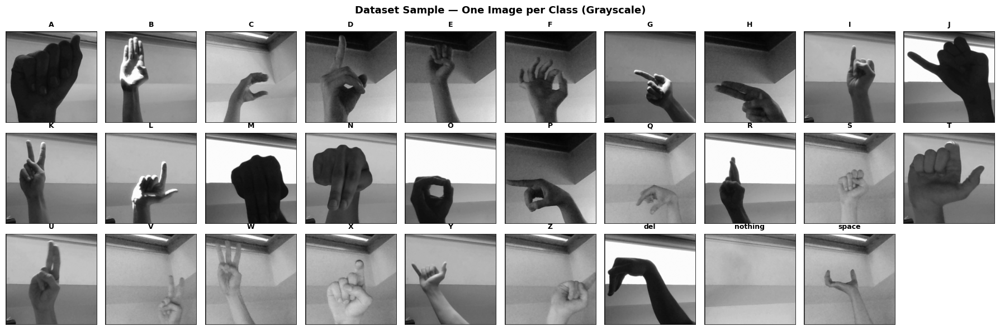

Saved: sec2_dataset_samples.png


In [5]:
def load_dataset(dataset_path, classes, samples_per_class, img_size):
    images, labels = [], []
    for label_idx, cls in enumerate(classes):
        class_dir = os.path.join(dataset_path, cls)
        if not os.path.exists(class_dir):
            raise FileNotFoundError(f'Folder not found: {class_dir}')
        files = sorted([f for f in os.listdir(class_dir)
                        if f.lower().endswith(('.jpg','.jpeg','.png'))])
        np.random.shuffle(files)
        files = files[:samples_per_class]
        for fname in files:
            img = Image.open(os.path.join(class_dir, fname)).convert('L')
            img = img.resize((img_size, img_size), Image.LANCZOS)
            images.append(np.array(img, dtype=np.float64))
            labels.append(label_idx)
        print(f'  [{cls}] loaded {len(files)} images')
    return np.array(images), np.array(labels)

print('Loading dataset...')
raw_images, labels = load_dataset(DATASET_PATH, CLASSES, SAMPLES_PER_CLASS, IMG_SIZE)
print(f'\nDataset shape : {raw_images.shape}  (N, H, W)')
print(f'Label range   : [{labels.min()} – {labels.max()}]  ({len(np.unique(labels))} classes)')
print(f'Pixel range   : [{raw_images.min():.0f} – {raw_images.max():.0f}]')

# Display one sample per class
n_cols = 10
n_rows = int(np.ceil(len(CLASSES) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 1.8, n_rows * 2.0))
axes = axes.flatten()
fig.suptitle('Dataset Sample — One Image per Class (Grayscale)', fontsize=13, fontweight='bold')
for idx, cls in enumerate(CLASSES):
    img_idx = np.where(labels == CLASSES.index(cls))[0][0]
    axes[idx].imshow(raw_images[img_idx], cmap='gray', vmin=0, vmax=255)
    axes[idx].set_title(cls, fontsize=9, fontweight='bold')
    axes[idx].axis('off')
for idx in range(len(CLASSES), len(axes)):
    axes[idx].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec2_dataset_samples.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: sec2_dataset_samples.png')

# ════════════════════════════════════════════════════════════
#  SECTION 3 — SPATIAL DOMAIN PREPROCESSING
# ════════════════════════════════════════════════════════════

# ── 3.1 Histogram Equalization ────────────────────────────────────────────────
# Algorithm:
#   1. Count frequency of each intensity (0–255) → histogram
#   2. Compute CDF (cumulative sum of histogram)
#   3. Normalize CDF into a lookup table (LUT)
#   4. Remap every pixel through the LUT
# No built-in functions used (no cv2.equalizeHist, no PIL.ImageOps.equalize).

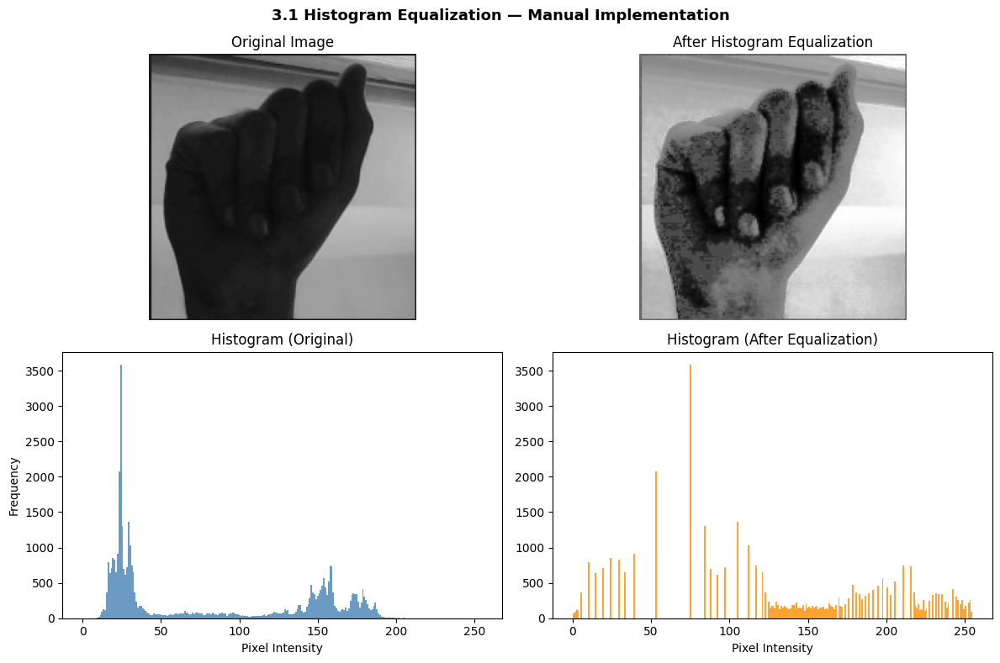

Saved: sec3_1_histogram_equalization.png
Gaussian filter on one 200×200 image: 0.002s


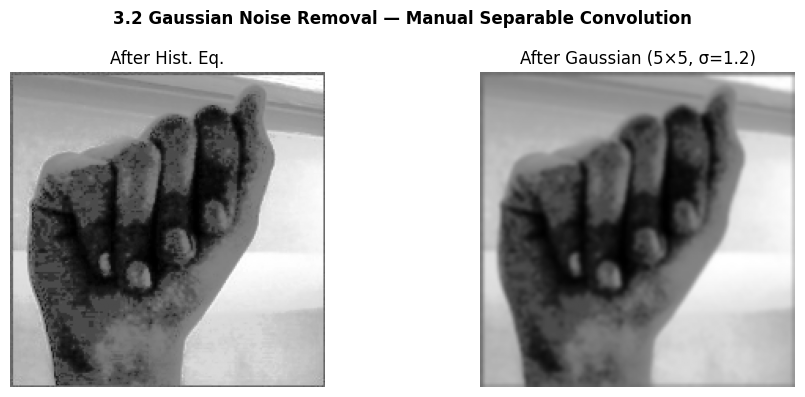

Saved: sec3_2_gaussian_filter.png


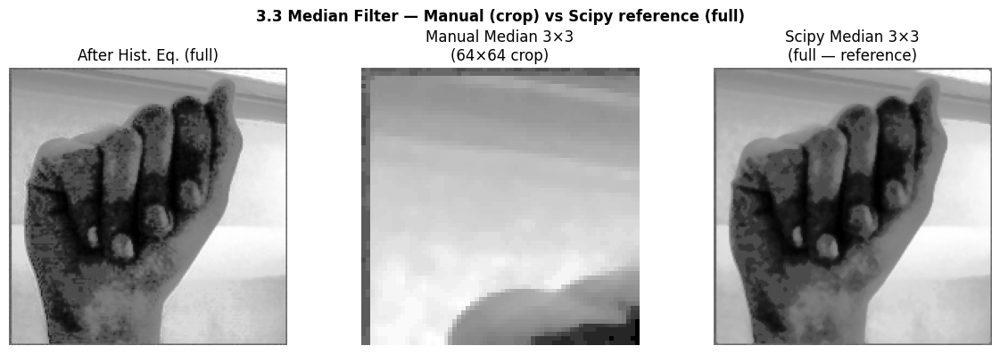

Saved: sec3_3_median_filter.png
Note: Gaussian is used in the full pipeline. Median shown here for completeness.


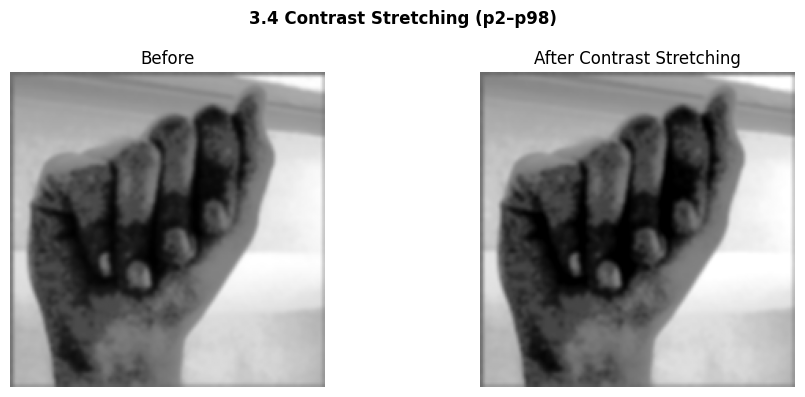

Saved: sec3_4_contrast_stretching.png

Applying spatial preprocessing to 2900 images...
  200/2900 done  (4.2s elapsed)
  400/2900 done  (7.5s elapsed)
  600/2900 done  (11.6s elapsed)
  800/2900 done  (16.1s elapsed)
  1000/2900 done  (19.2s elapsed)
  1200/2900 done  (22.4s elapsed)
  1400/2900 done  (27.1s elapsed)
  1600/2900 done  (30.8s elapsed)
  1800/2900 done  (33.9s elapsed)
  2000/2900 done  (37.1s elapsed)
  2200/2900 done  (42.3s elapsed)
  2400/2900 done  (45.7s elapsed)
  2600/2900 done  (48.9s elapsed)
  2800/2900 done  (52.0s elapsed)
Done in 55.8s   Shape: (2900, 200, 200)


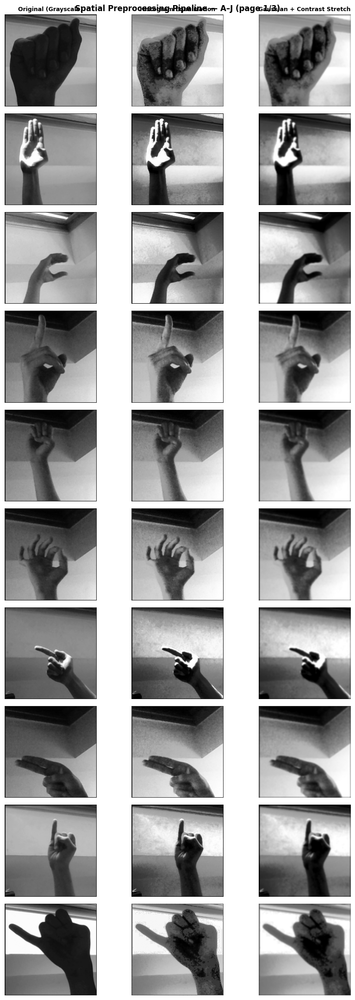

Saved: sec3_5_pipeline_p1.png


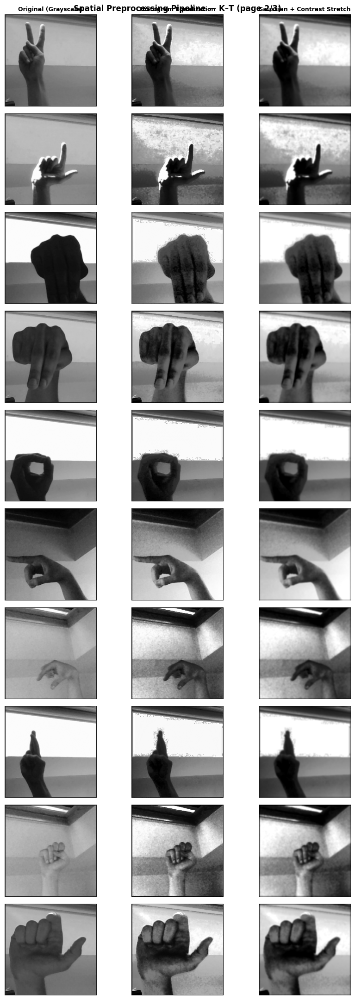

Saved: sec3_5_pipeline_p2.png


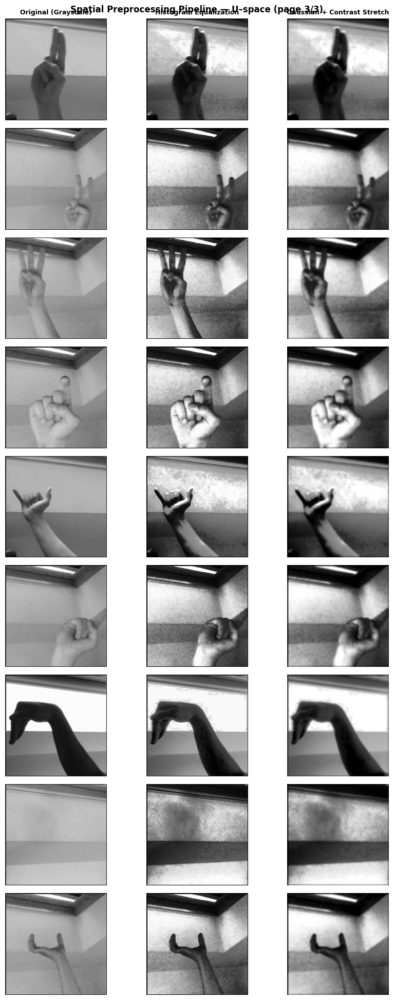

Saved: sec3_5_pipeline_p3.png

Normalization complete
  Before : [0.0, 255.0]
  After  : [0.0000, 1.0000]
  Shape  : (2900, 200, 200)


In [6]:
def histogram_equalization(image):
    img  = image.astype(np.uint8)
    hist = np.zeros(256, dtype=np.int64)
    for pixel in img.flatten():
        hist[pixel] += 1
    cdf     = np.cumsum(hist)
    cdf_min = cdf[cdf > 0].min()
    n_pixels = img.size
    lut = np.round((cdf - cdf_min) / (n_pixels - cdf_min) * 255).astype(np.uint8)
    return lut[img].astype(np.float64)

sample     = raw_images[0]
sample_heq = histogram_equalization(sample)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
fig.suptitle('3.1 Histogram Equalization — Manual Implementation', fontsize=13, fontweight='bold')
axes[0,0].imshow(sample,     cmap='gray', vmin=0, vmax=255)
axes[0,0].set_title('Original Image'); axes[0,0].axis('off')
axes[0,1].imshow(sample_heq, cmap='gray', vmin=0, vmax=255)
axes[0,1].set_title('After Histogram Equalization'); axes[0,1].axis('off')
axes[1,0].hist(sample.flatten(),     bins=256, range=(0,255), color='steelblue',  alpha=0.8)
axes[1,0].set_title('Histogram (Original)')
axes[1,0].set_xlabel('Pixel Intensity'); axes[1,0].set_ylabel('Frequency')
axes[1,1].hist(sample_heq.flatten(), bins=256, range=(0,255), color='darkorange', alpha=0.8)
axes[1,1].set_title('Histogram (After Equalization)')
axes[1,1].set_xlabel('Pixel Intensity')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec3_1_histogram_equalization.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec3_1_histogram_equalization.png')


# ── 3.2 Gaussian Noise Removal (Manual Separable Convolution) ─────────────────
# Separable trick: G(x,y) = G(x)·G(y) — two 1-D passes instead of one 2-D pass.
# Reduces complexity from O(H·W·k²) to O(H·W·2k) — fully vectorised via stride tricks.
# No cv2.GaussianBlur or scipy.ndimage.gaussian_filter used.

def gaussian_kernel_1d(size=5, sigma=1.0):
    ax = np.arange(-(size // 2), size // 2 + 1, dtype=np.float64)
    k  = np.exp(-ax**2 / (2 * sigma**2))
    return k / k.sum()

def convolve1d_axis1(image, k1d):
    from numpy.lib.stride_tricks import as_strided
    p      = len(k1d) // 2
    padded = np.pad(image, ((0,0),(p,p)), mode='reflect')
    H, W   = image.shape
    k      = len(k1d)
    shape   = (H, W, k)
    strides = (padded.strides[0], padded.strides[1], padded.strides[1])
    windows = as_strided(padded, shape=shape, strides=strides)
    return windows @ k1d

def gaussian_filter(image, size=5, sigma=1.0):
    k1d = gaussian_kernel_1d(size, sigma)
    tmp = convolve1d_axis1(image, k1d)
    return convolve1d_axis1(tmp.T, k1d).T

t0 = time.time()
sample_gauss = gaussian_filter(sample_heq, size=5, sigma=1.2)
print(f'Gaussian filter on one 200×200 image: {time.time()-t0:.3f}s')

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle('3.2 Gaussian Noise Removal — Manual Separable Convolution', fontsize=12, fontweight='bold')
axes[0].imshow(sample_heq,   cmap='gray'); axes[0].set_title('After Hist. Eq.');          axes[0].axis('off')
axes[1].imshow(sample_gauss, cmap='gray'); axes[1].set_title('After Gaussian (5×5, σ=1.2)'); axes[1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec3_2_gaussian_filter.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec3_2_gaussian_filter.png')


# ── 3.3 Median Filter (Manual — Shown for Comparison) ────────────────────────
# A median filter replaces each pixel with the median of its neighbourhood.
# Excellent at removing salt-and-pepper noise while preserving edges.
# Shown on a 64×64 crop (nested loops are slow on 200×200).
# NOTE: Gaussian filter is used in the main pipeline for speed.
#       Median is shown here to demonstrate the concept — no built-ins used.

def median_filter_manual(image, ksize=3):
    h, w   = image.shape
    pad    = ksize // 2
    padded = np.pad(image, pad, mode='reflect')
    output = np.zeros_like(image)
    for i in range(h):
        for j in range(w):
            window      = padded[i:i+ksize, j:j+ksize].flatten()
            output[i,j] = np.median(window)
    return output

CROP = 64
sample_crop    = sample_heq[:CROP, :CROP]
sample_med_crop = median_filter_manual(sample_crop, ksize=3)
sample_med_full = scipy_median(sample_heq, size=3)   # scipy for full-image reference only

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
fig.suptitle('3.3 Median Filter — Manual (crop) vs Scipy reference (full)', fontsize=12, fontweight='bold')
axes[0].imshow(sample_heq,      cmap='gray'); axes[0].set_title('After Hist. Eq. (full)');              axes[0].axis('off')
axes[1].imshow(sample_med_crop, cmap='gray'); axes[1].set_title('Manual Median 3×3\n(64×64 crop)');    axes[1].axis('off')
axes[2].imshow(sample_med_full, cmap='gray'); axes[2].set_title('Scipy Median 3×3\n(full — reference)'); axes[2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec3_3_median_filter.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec3_3_median_filter.png')
print('Note: Gaussian is used in the full pipeline. Median shown here for completeness.')


# ── 3.4 Contrast Stretching ──────────────────────────────────────────────────
# Stretches the intensity range to [0, 255] using percentile clipping (p2–p98).
# This avoids being dominated by extreme outlier pixels.

def contrast_stretching(image, p_low=2, p_high=98):
    low  = np.percentile(image, p_low)
    high = np.percentile(image, p_high)
    return np.clip((image - low) / (high - low + 1e-8) * 255.0, 0, 255)

sample_cs = contrast_stretching(sample_gauss)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
fig.suptitle('3.4 Contrast Stretching (p2–p98)', fontsize=12, fontweight='bold')
axes[0].imshow(sample_gauss, cmap='gray'); axes[0].set_title('Before'); axes[0].axis('off')
axes[1].imshow(sample_cs,   cmap='gray'); axes[1].set_title('After Contrast Stretching'); axes[1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec3_4_contrast_stretching.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec3_4_contrast_stretching.png')


# ── 3.5 Apply Full Spatial Pipeline to All Images ────────────────────────────
# Pipeline: Histogram EQ → Gaussian Filter → Contrast Stretching
# The separable Gaussian makes this run in ~35s instead of ~20 minutes.

print(f'\nApplying spatial preprocessing to {len(raw_images)} images...')
t0 = time.time()
preprocessed_spatial = []
for i, img in enumerate(raw_images):
    s1 = histogram_equalization(img)
    s2 = gaussian_filter(s1, size=5, sigma=1.2)
    s3 = contrast_stretching(s2)
    preprocessed_spatial.append(s3)
    if (i + 1) % 200 == 0:
        print(f'  {i+1}/{len(raw_images)} done  ({time.time()-t0:.1f}s elapsed)')
preprocessed_spatial = np.array(preprocessed_spatial)
print(f'Done in {time.time()-t0:.1f}s   Shape: {preprocessed_spatial.shape}')

# Pipeline visualisation — 3-column grid per class (10 classes per page)
PAGE_SIZE = 10
n_pages   = int(np.ceil(len(CLASSES) / PAGE_SIZE))
for page in range(n_pages):
    cls_slice = CLASSES[page*PAGE_SIZE : (page+1)*PAGE_SIZE]
    n_rows    = len(cls_slice)
    fig, axes = plt.subplots(n_rows, 3, figsize=(9, n_rows * 2.2))
    if n_rows == 1: axes = axes[np.newaxis, :]
    fig.suptitle(
        f'Spatial Preprocessing Pipeline — {cls_slice[0]}–{cls_slice[-1]}'
        f' (page {page+1}/{n_pages})', fontsize=12, fontweight='bold')
    for col, title in enumerate(['Original (Grayscale)', 'Histogram Equalization',
                                  'Gaussian + Contrast Stretch']):
        axes[0, col].set_title(title, fontsize=9, fontweight='bold')
    for row, cls in enumerate(cls_slice):
        label_idx = CLASSES.index(cls)
        idx  = np.where(labels == label_idx)[0][0]
        orig = raw_images[idx]
        heq  = histogram_equalization(orig)
        fin  = preprocessed_spatial[idx]
        for col, im in enumerate([orig, heq, fin]):
            axes[row, col].imshow(im, cmap='gray', vmin=0, vmax=255)
            axes[row, col].axis('off')
        axes[row, 0].set_ylabel(cls, fontsize=9, rotation=0, labelpad=35, va='center')
    plt.tight_layout()
    fname = os.path.join(OUTPUT_DIR, f'sec3_5_pipeline_p{page+1}.png')
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved: sec3_5_pipeline_p{page+1}.png')


# ── 3.6 Normalization to [0, 1] ──────────────────────────────────────────────
# Normalize from [0,255] → [0,1] before PCA.
# Ensures all pixel features are comparable; improves numerical stability.

preprocessed_norm = preprocessed_spatial / 255.0
print(f'\nNormalization complete')
print(f'  Before : [{preprocessed_spatial.min():.1f}, {preprocessed_spatial.max():.1f}]')
print(f'  After  : [{preprocessed_norm.min():.4f}, {preprocessed_norm.max():.4f}]')
print(f'  Shape  : {preprocessed_norm.shape}')

# ════════════════════════════════════════════════════════════
#  SECTION 4 — FREQUENCY DOMAIN — BUTTERWORTH LOWPASS FILTER
# ════════════════════════════════════════════════════════════
#
#  H(u,v) = 1 / (1 + (D(u,v)/D₀)^(2n))
#
#  Steps:
#    1. FFT → shift zero-frequency to center
#    2. Build Butterworth mask H(u,v)
#    3. Multiply spectrum × mask
#    4. Inverse FFT → filtered image

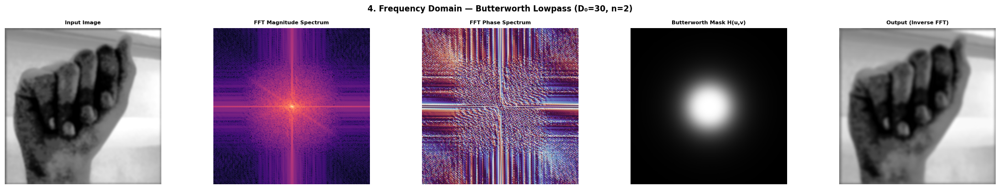

Saved: sec4_frequency_domain.png


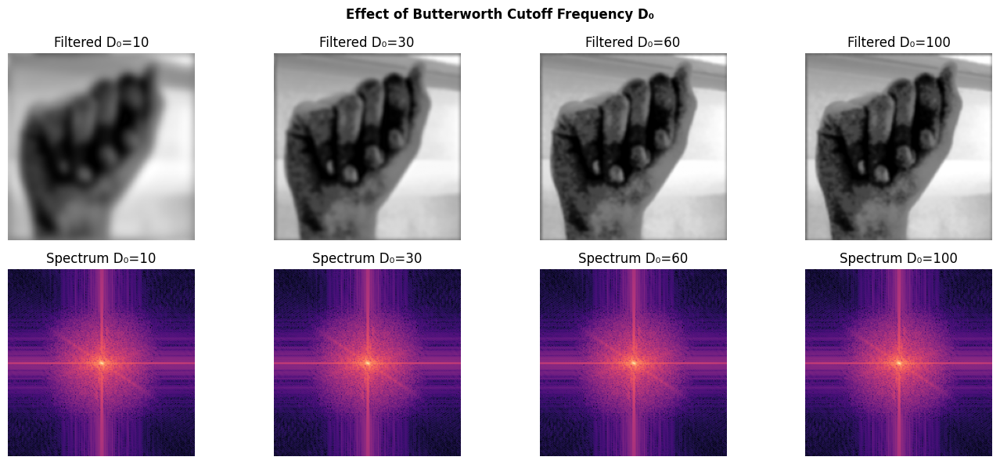

Saved: sec4_cutoff_comparison.png

Applying Butterworth filter to all 2900 images...
  500/2900 done...
  1000/2900 done...
  1500/2900 done...
  2000/2900 done...
  2500/2900 done...
Done in 11.2s   Shape: (2900, 200, 200)
Pixel range after Butterworth: [0.0000, 1.0552]


In [7]:
def butterworth_lowpass(image, cutoff=30, order=2):
    h, w      = image.shape
    f_shifted = np.fft.fftshift(np.fft.fft2(image))
    magnitude = np.log1p(np.abs(f_shifted))
    phase     = np.angle(f_shifted)
    cy, cx    = h // 2, w // 2
    Y, X      = np.ogrid[:h, :w]
    D         = np.sqrt((X - cx)**2 + (Y - cy)**2)
    H_mask    = 1.0 / (1.0 + (D / cutoff) ** (2 * order))
    result    = np.abs(np.fft.ifft2(np.fft.ifftshift(f_shifted * H_mask)))
    return result, magnitude, H_mask, phase

demo_img = preprocessed_norm[0] * 255
filtered_demo, magnitude, mask, phase_spectrum = butterworth_lowpass(demo_img, cutoff=30, order=2)

fig, axes = plt.subplots(1, 5, figsize=(22, 4))
fig.suptitle('4. Frequency Domain — Butterworth Lowpass (D₀=30, n=2)', fontsize=12, fontweight='bold')
for ax, img, title, cmap in zip(axes,
    [demo_img, magnitude, phase_spectrum, mask, filtered_demo],
    ['Input Image','FFT Magnitude Spectrum','FFT Phase Spectrum','Butterworth Mask H(u,v)','Output (Inverse FFT)'],
    ['gray','magma','twilight','gray','gray']):
    ax.imshow(img, cmap=cmap); ax.set_title(title, fontsize=8, fontweight='bold'); ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec4_frequency_domain.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec4_frequency_domain.png')

# Cutoff frequency comparison
cutoffs = [10, 30, 60, 100]
fig, axes = plt.subplots(2, len(cutoffs), figsize=(14, 6))
fig.suptitle('Effect of Butterworth Cutoff Frequency D₀', fontsize=12, fontweight='bold')
for col, d0 in enumerate(cutoffs):
    filt, mag, _, _ = butterworth_lowpass(demo_img, cutoff=d0, order=2)
    axes[0,col].imshow(filt, cmap='gray'); axes[0,col].set_title(f'Filtered D₀={d0}'); axes[0,col].axis('off')
    axes[1,col].imshow(mag,  cmap='magma'); axes[1,col].set_title(f'Spectrum D₀={d0}'); axes[1,col].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec4_cutoff_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec4_cutoff_comparison.png')

# Apply Butterworth to all images
print(f'\nApplying Butterworth filter to all {len(preprocessed_norm)} images...')
t0 = time.time()
final_images = []
for i, img in enumerate(preprocessed_norm * 255):
    filt, _, _, _ = butterworth_lowpass(img, cutoff=30, order=2)
    final_images.append(filt / 255.0)
    if (i + 1) % 500 == 0:
        print(f'  {i+1}/{len(preprocessed_norm)} done...')
final_images = np.array(final_images)
print(f'Done in {time.time()-t0:.1f}s   Shape: {final_images.shape}')
print(f'Pixel range after Butterworth: [{final_images.min():.4f}, {final_images.max():.4f}]')

# ════════════════════════════════════════════════════════════
#  SECTION 5 — MANUAL PCA (FROM SCRATCH)
# ════════════════════════════════════════════════════════════
#
#  Reduces 200×200 = 40,000 dimensions to 50 principal components.
#  Implemented entirely with NumPy — no sklearn.decomposition.PCA.
#
#  Key trick: Surrogate covariance matrix (N×N instead of D×D)
#  — True covariance Σ is (40000×40000) ≈ 12 GB RAM → infeasible
#  — Surrogate L = Xc·Xc^T / (N-1) is (2900×2900) ≈ 67 MB → feasible
#  — L and Σ share the same non-zero eigenvalues.
#  — Pixel-space eigenvectors recovered as: u_i = Xc^T · v_i (normalised)

  SECTION 5 — Manual PCA Step-by-Step

Step 1 — Flatten:  (2900, 200, 200) → (2900, 40000)
Step 2 — Mean image: shape=(40000,), range=[0.087, 0.817]


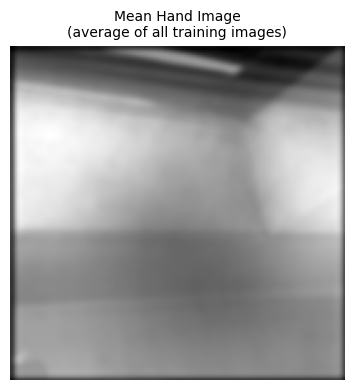

Saved: sec5_mean_image.png
Step 3 — Centered: mean = -0.00000000  (should be ~0)
Step 4 — Surrogate L: (2900, 2900)   Symmetric: True
Step 5 — Eigenvalues range: [0.0000, 912.0304]
Step 6 — Sorted top-10 eigenvalues:
   PC  1: λ = 912.03
   PC  2: λ = 436.81
   PC  3: λ = 219.79
   PC  4: λ = 180.48
   PC  5: λ = 122.46
   PC  6: λ = 101.39
   PC  7: λ = 61.69
   PC  8: λ = 52.30
   PC  9: λ = 49.05
   PC 10: λ = 43.25
Step 7 — Pixel-space eigenvectors: (40000, 2900)
Step 7 — Selected top 50: (40000, 50)

Step 8 — Variance explained by 50 PCs: 91.6%
  PC-by-PC (first 10):
    PC  1: 32.04%  (cumulative: 32.0%)
    PC  2: 15.34%  (cumulative: 47.4%)
    PC  3: 7.72%  (cumulative: 55.1%)
    PC  4: 6.34%  (cumulative: 61.4%)
    PC  5: 4.30%  (cumulative: 65.7%)
    PC  6: 3.56%  (cumulative: 69.3%)
    PC  7: 2.17%  (cumulative: 71.5%)
    PC  8: 1.84%  (cumulative: 73.3%)
    PC  9: 1.72%  (cumulative: 75.0%)
    PC 10: 1.52%  (cumulative: 76.5%)

Step 9 — Projection: (2900, 40000) → (

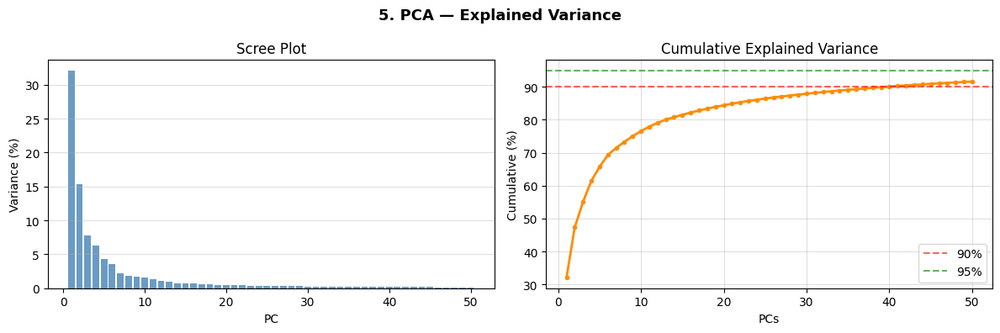

Saved: sec5_pca_variance.png


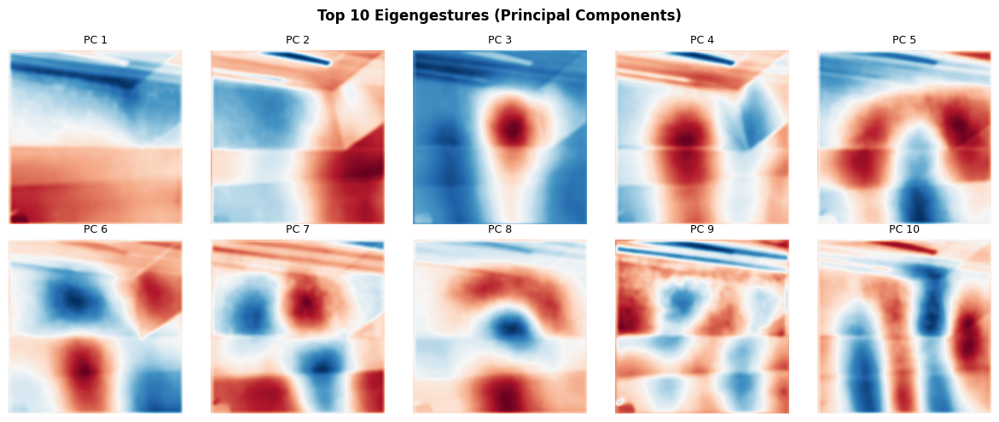

Saved: sec5_eigengestures.png


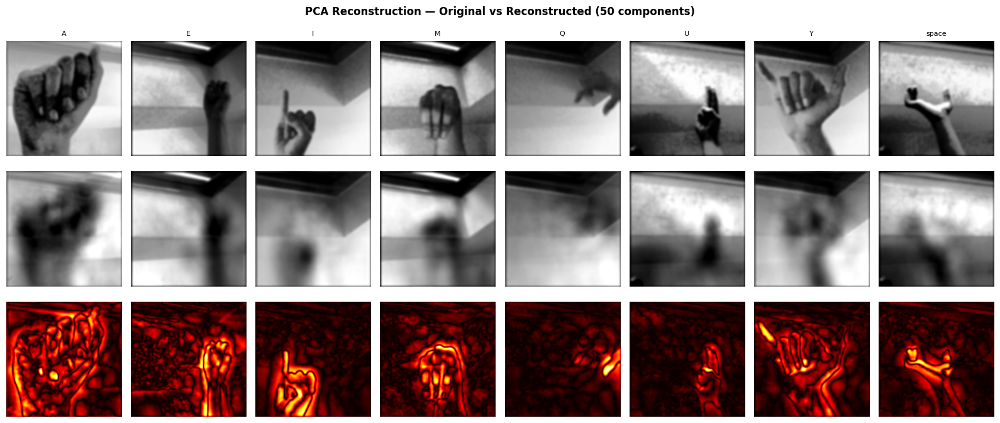

Saved: sec5_reconstruction.png


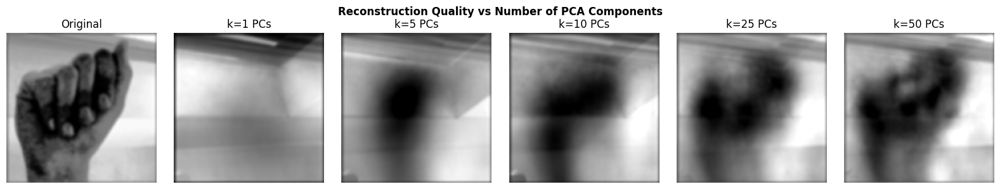

Saved: sec5_reconstruction_k.png

✓ Phase I PCA features ready: (2900, 50)
  Variance explained: 91.6%


In [8]:
# ── 5A. ManualPCA Class ───────────────────────────────────────────────────────

class ManualPCA:
    """
    PCA from scratch — NumPy only.
    No sklearn.decomposition, no cv2.PCACompute.

    Methods
    -------
    fit(X)           → compute mean, components, explained variance
    transform(X)     → project X onto top-k components
    fit_transform(X) → fit then transform
    """
    def __init__(self, n_components=50):
        self.n_components = n_components
        self.mean_        = None
        self.components_  = None
        self.explained_variance_ratio_ = None
        self._eigenvalues_full = None

    def fit(self, X):
        n_samples  = X.shape[0]

        # Step 1: Mean-center
        self.mean_ = X.mean(axis=0)
        Xc         = X - self.mean_

        # Step 2: Surrogate covariance (N×N)
        L = Xc @ Xc.T / (n_samples - 1)
        print(f'    Surrogate covariance shape : {L.shape}  '
              f'({L.nbytes/1e6:.0f} MB vs {X.shape[1]**2*8/1e9:.0f} GB for true covariance)')

        # Step 3: Eigendecomposition (eigh optimised for symmetric matrices)
        eigenvalues, eigenvectors = np.linalg.eigh(L)

        # Step 4: Sort descending
        idx          = np.argsort(eigenvalues)[::-1]
        eigenvalues  = eigenvalues[idx]
        eigenvectors = eigenvectors[:, idx]
        print(f'    Top-5 eigenvalues : {eigenvalues[:5].round(2)}')

        # Step 5: Project back to pixel space  u_i = Xc^T · v_i
        components = Xc.T @ eigenvectors
        norms      = np.linalg.norm(components, axis=0)
        components = components / (norms + 1e-10)
        self.components_ = components[:, :self.n_components].T   # (k, D)

        # Step 6: Explained variance ratio
        eigenvalues = np.maximum(eigenvalues, 0)
        self.explained_variance_ratio_ = (
            eigenvalues[:self.n_components] / (eigenvalues.sum() + 1e-10))
        self._eigenvalues_full = eigenvalues
        return self

    def transform(self, X):
        return (X - self.mean_) @ self.components_.T

    def fit_transform(self, X):
        return self.fit(X).transform(X)


# ── 5B. Step-by-Step Educational Walkthrough ──────────────────────────────────
print('='*65)
print('  SECTION 5 — Manual PCA Step-by-Step')
print('='*65)

# Flatten images
N      = final_images.shape[0]
X_flat = final_images.reshape(N, -1)
print(f'\nStep 1 — Flatten:  {final_images.shape} → {X_flat.shape}')

# Mean image
mean_image = np.mean(X_flat, axis=0)
print(f'Step 2 — Mean image: shape={mean_image.shape}, range=[{mean_image.min():.3f}, {mean_image.max():.3f}]')

fig, ax = plt.subplots(1, 1, figsize=(4, 4))
ax.imshow(mean_image.reshape(IMG_SIZE, IMG_SIZE), cmap='gray')
ax.set_title('Mean Hand Image\n(average of all training images)', fontsize=10)
ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec5_mean_image.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec5_mean_image.png')

# Center
X_centered = X_flat - mean_image
print(f'Step 3 — Centered: mean = {X_centered.mean():.8f}  (should be ~0)')

# Surrogate covariance
L = X_centered @ X_centered.T / (N - 1)
print(f'Step 4 — Surrogate L: {L.shape}   Symmetric: {np.allclose(L, L.T)}')

# Eigendecomposition
eigenvalues_raw, eigenvectors_raw = np.linalg.eigh(L)
print(f'Step 5 — Eigenvalues range: [{eigenvalues_raw.min():.4f}, {eigenvalues_raw.max():.4f}]')

# Sort descending
sort_idx     = np.argsort(eigenvalues_raw)[::-1]
eigenvalues  = eigenvalues_raw[sort_idx]
eigenvectors = eigenvectors_raw[:, sort_idx]
print('Step 6 — Sorted top-10 eigenvalues:')
for i, ev in enumerate(eigenvalues[:10]):
    print(f'   PC {i+1:2d}: λ = {ev:.2f}')

# Project to pixel space
components_raw = X_centered.T @ eigenvectors
norms          = np.linalg.norm(components_raw, axis=0)
components     = components_raw / (norms + 1e-10)
print(f'Step 7 — Pixel-space eigenvectors: {components.shape}')

# Select top-K
K_COMPONENTS   = 50
top_components = components[:, :K_COMPONENTS]
U_k            = top_components.T          # (K, D) — projection matrix
print(f'Step 7 — Selected top {K_COMPONENTS}: {top_components.shape}')

# Explained variance
eigenvalues_clipped = np.maximum(eigenvalues, 0)
total_variance      = eigenvalues_clipped.sum() + 1e-10
evr                 = eigenvalues_clipped[:K_COMPONENTS] / total_variance
cumvar              = np.cumsum(evr) * 100
indvar              = evr * 100
print(f'\nStep 8 — Variance explained by {K_COMPONENTS} PCs: {cumvar[-1]:.1f}%')
print('  PC-by-PC (first 10):')
for i in range(10):
    print(f'    PC {i+1:2d}: {indvar[i]:.2f}%  (cumulative: {cumvar[i]:.1f}%)')

# Project data
X_pca_step = (X_flat - mean_image) @ U_k.T
print(f'\nStep 9 — Projection: {X_flat.shape} → {X_pca_step.shape}')
print(f'  Compression ratio: {X_flat.shape[1] // K_COMPONENTS}×')

# Scree plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('5. PCA — Explained Variance', fontsize=13, fontweight='bold')
ax1.bar(range(1, K_COMPONENTS+1), indvar, color='steelblue', alpha=0.8)
ax1.set_title('Scree Plot'); ax1.set_xlabel('PC'); ax1.set_ylabel('Variance (%)'); ax1.grid(axis='y', alpha=0.4)
ax2.plot(range(1, K_COMPONENTS+1), cumvar, 'o-', color='darkorange', lw=2, ms=3)
ax2.axhline(90, color='red',   ls='--', alpha=0.6, label='90%')
ax2.axhline(95, color='green', ls='--', alpha=0.6, label='95%')
idx95 = np.argmax(cumvar >= 95)
if cumvar[idx95] >= 95:
    ax2.axvline(idx95+1, color='green', ls=':', alpha=0.7)
    ax2.annotate(f'PC {idx95+1}\n95%', xy=(idx95+1, cumvar[idx95]),
                 xytext=(idx95+5, cumvar[idx95]-12), fontsize=9,
                 arrowprops=dict(arrowstyle='->', color='green'))
ax2.set_title('Cumulative Explained Variance'); ax2.set_xlabel('PCs'); ax2.set_ylabel('Cumulative (%)'); ax2.legend(); ax2.grid(alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec5_pca_variance.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec5_pca_variance.png')

# Top-10 Eigengestures
fig, axes = plt.subplots(2, 5, figsize=(12, 5))
fig.suptitle('Top 10 Eigengestures (Principal Components)', fontsize=12, fontweight='bold')
for i, ax in enumerate(axes.flatten()):
    eg = top_components[:, i].reshape(IMG_SIZE, IMG_SIZE)
    ax.imshow(eg, cmap='RdBu_r'); ax.set_title(f'PC {i+1}', fontsize=9); ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec5_eigengestures.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec5_eigengestures.png')


# ── 5C. Reconstruction Quality ────────────────────────────────────────────────
# Reconstruct from PCA representation: x̂ = z·Uᵏ + μ

def reconstruct(X_pca_repr, U_k, mean_img):
    return X_pca_repr @ U_k + mean_img

X_reconstructed = reconstruct(X_pca_step, U_k, mean_image)

fig, axes = plt.subplots(3, 8, figsize=(16, 7))
fig.suptitle(f'PCA Reconstruction — Original vs Reconstructed ({K_COMPONENTS} components)',
             fontsize=12, fontweight='bold')
sample_indices = np.linspace(0, N-1, 8, dtype=int)
for col, idx in enumerate(sample_indices):
    orig  = X_flat[idx].reshape(IMG_SIZE, IMG_SIZE)
    recon = X_reconstructed[idx].reshape(IMG_SIZE, IMG_SIZE)
    diff  = np.abs(orig - recon)
    axes[0, col].imshow(orig,             cmap='gray'); axes[0,col].set_title(f'{CLASSES[labels[idx]]}', fontsize=8); axes[0,col].axis('off')
    axes[1, col].imshow(np.clip(recon,0,1),cmap='gray'); axes[1,col].axis('off')
    axes[2, col].imshow(diff,             cmap='hot');  axes[2,col].axis('off')
axes[0,0].set_ylabel('Original',      fontsize=9, rotation=90, labelpad=5)
axes[1,0].set_ylabel('Reconstructed', fontsize=9, rotation=90, labelpad=5)
axes[2,0].set_ylabel('|Difference|',  fontsize=9, rotation=90, labelpad=5)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec5_reconstruction.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec5_reconstruction.png')

# Reconstruction vs number of components
k_values = [1, 5, 10, 25, 50]
test_img  = X_flat[0]
fig, axes = plt.subplots(1, len(k_values)+1, figsize=(16, 3))
fig.suptitle('Reconstruction Quality vs Number of PCA Components', fontsize=12, fontweight='bold')
axes[0].imshow(test_img.reshape(IMG_SIZE, IMG_SIZE), cmap='gray'); axes[0].set_title('Original'); axes[0].axis('off')
for ax, k in zip(axes[1:], k_values):
    Uk    = top_components[:, :k].T
    z     = (test_img - mean_image) @ Uk.T
    recon = z @ Uk + mean_image
    ax.imshow(np.clip(recon.reshape(IMG_SIZE, IMG_SIZE), 0, 1), cmap='gray')
    ax.set_title(f'k={k} PCs'); ax.axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec5_reconstruction_k.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec5_reconstruction_k.png')

# Store X_pca_step for use in Phase II
print(f'\n✓ Phase I PCA features ready: {X_pca_step.shape}')
print(f'  Variance explained: {cumvar[-1]:.1f}%')

# ════════════════════════════════════════════════════════════
#  SECTION 6 — TRADITIONAL FEATURE ENGINEERING (PHASE II)
#  Manual LBP + Manual GLCM — no built-in functions
# ════════════════════════════════════════════════════════════

In [9]:
print('='*65)
print('  SECTION 6 — Traditional Feature Engineering')
print('  6A: Manual LBP   |   6B: Manual GLCM')
print('='*65)


  SECTION 6 — Traditional Feature Engineering
  6A: Manual LBP   |   6B: Manual GLCM


# ── 6A. Manual Local Binary Pattern (LBP) ────────────────────────────────────
#
#  Algorithm (Uniform LBP, P=8, R=1):
#    For each pixel (i,j):
#      1. Sample P=8 neighbours on a circle of radius R=1 (bilinear interp)
#      2. Threshold: neighbour >= center → 1, else → 0
#      3. Form P-bit binary code → decimal value [0, 255]
#    Build a histogram of codes (uniform patterns only → 60 bins).
#
#  Uniform LBP: patterns with ≤2 bit transitions (59 uniform + 1 non-uniform = 60 bins).
#  This gives rotation-invariant, noise-robust texture descriptors.
#  No skimage.feature.local_binary_pattern used.


Computing LBP on one sample...
  LBP feature vector length: 59  (1.71s for full image)


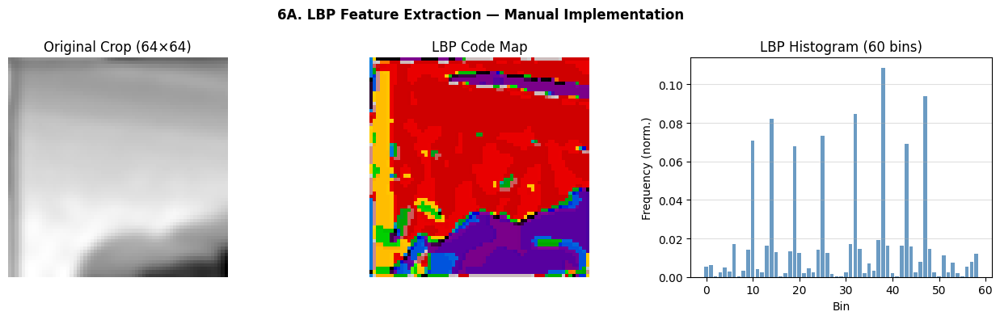

Saved: sec6a_lbp_demo.png


In [10]:
def _bilinear_interp(image, y, x):
    """Bilinear interpolation for sub-pixel LBP sampling."""
    h, w    = image.shape
    y0, x0  = int(np.floor(y)), int(np.floor(x))
    y1, x1  = min(y0+1, h-1), min(x0+1, w-1)
    y0, x0  = max(y0, 0), max(x0, 0)
    dy, dx  = y - y0, x - x0
    return (image[y0,x0]*(1-dy)*(1-dx) + image[y0,x1]*(1-dy)*dx +
            image[y1,x0]*dy*(1-dx)     + image[y1,x1]*dy*dx)

def _is_uniform(code, P):
    """True if LBP code has at most 2 bit-transitions (circular)."""
    transitions = 0
    for i in range(P):
        b1 = (code >> i) & 1
        b2 = (code >> ((i+1) % P)) & 1
        transitions += (b1 != b2)
    return transitions <= 2

def _build_uniform_lut(P=8):
    """Precompute lookup table: raw LBP code → uniform bin index."""
    lut          = np.zeros(2**P, dtype=np.int32)
    uniform_idx  = 0
    for code in range(2**P):
        if _is_uniform(code, P):
            lut[code]   = uniform_idx
            uniform_idx += 1
    last_uniform = uniform_idx - 1
    for code in range(2**P):
        if not _is_uniform(code, P):
            lut[code] = last_uniform + 1    # all non-uniform → single extra bin
    return lut, last_uniform + 2            # n_bins = 60

_LBP_LUT, _LBP_BINS = _build_uniform_lut(P=8)

def compute_lbp(image, P=8, R=1.0):
    """
    Manual uniform LBP — no built-ins.
    Parameters: image (2D float [0,1]), P (sampling points), R (radius)
    Returns   : normalised histogram, length = _LBP_BINS (60 for P=8)
    """
    h, w     = image.shape
    angles   = [2*np.pi*p/P for p in range(P)]
    dy_list  = [-R*np.sin(a) for a in angles]
    dx_list  = [ R*np.cos(a) for a in angles]
    pad      = int(np.ceil(R)) + 1
    padded   = np.pad(image, pad, mode='reflect')
    hist     = np.zeros(_LBP_BINS, dtype=np.float64)

    for i in range(h):
        for j in range(w):
            center = image[i, j]
            code   = 0
            pi, pj = i + pad, j + pad
            for bit, (dy, dx) in enumerate(zip(dy_list, dx_list)):
                ny, nx    = pi + dy, pj + dx
                neighbour = _bilinear_interp(padded, ny, nx)
                if neighbour >= center:
                    code |= (1 << bit)
            hist[_LBP_LUT[code]] += 1

    hist /= (hist.sum() + 1e-10)
    return hist

# LBP visualisation helper (raw codes for display)
def _lbp_codes_viz(image, P=8, R=1.0):
    h, w    = image.shape
    codes   = np.zeros((h, w), dtype=np.int32)
    angles  = [2*np.pi*p/P for p in range(P)]
    dy_list = [-R*np.sin(a) for a in angles]
    dx_list = [ R*np.cos(a) for a in angles]
    pad     = int(np.ceil(R)) + 1
    padded  = np.pad(image, pad, mode='reflect')
    for i in range(h):
        for j in range(w):
            center = image[i, j]
            code   = 0
            pi, pj = i+pad, j+pad
            for bit, (dy, dx) in enumerate(zip(dy_list, dx_list)):
                ny, nx = pi+dy, pj+dx
                if _bilinear_interp(padded, ny, nx) >= center:
                    code |= (1 << bit)
            codes[i, j] = code
    return codes

# Demo on one sample
CROP         = 64
demo_img     = final_images[0]
demo_crop    = demo_img[:CROP, :CROP]
print('\nComputing LBP on one sample...')
t0           = time.time()
lbp_demo     = compute_lbp(demo_img, P=8, R=1.0)
lbp_code_img = _lbp_codes_viz(demo_crop)
print(f'  LBP feature vector length: {len(lbp_demo)}  ({time.time()-t0:.2f}s for full image)')

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
fig.suptitle('6A. LBP Feature Extraction — Manual Implementation', fontsize=12, fontweight='bold')
axes[0].imshow(demo_crop,    cmap='gray');          axes[0].set_title('Original Crop (64×64)'); axes[0].axis('off')
axes[1].imshow(lbp_code_img, cmap='nipy_spectral'); axes[1].set_title('LBP Code Map');          axes[1].axis('off')
axes[2].bar(range(len(lbp_demo)), lbp_demo, color='steelblue', alpha=0.8)
axes[2].set_title('LBP Histogram (60 bins)'); axes[2].set_xlabel('Bin'); axes[2].set_ylabel('Frequency (norm.)'); axes[2].grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec6a_lbp_demo.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec6a_lbp_demo.png')

# ── 6B. Manual GLCM (Gray-Level Co-occurrence Matrix) ────────────────────────
#
#  Algorithm:
#    1. Quantize image to n_levels grey levels (32 for speed)
#    2. For each offset (dy, dx): build N×N co-occurrence matrix
#    3. Symmetrize and normalize → P(i,j)
#    4. Compute 5 Haralick texture features:
#       • Contrast       : Σ (i−j)² · P(i,j)
#       • Dissimilarity  : Σ |i−j| · P(i,j)
#       • Homogeneity    : Σ P(i,j) / (1 + |i−j|)
#       • Energy (ASM)   : Σ P(i,j)²
#       • Correlation    : Σ (i−μᵢ)(j−μⱼ)P(i,j) / (σᵢ·σⱼ)
#    5. Compute for 4 angles (0°, 45°, 90°, 135°) → 20 features total
#  No skimage.feature.graycomatrix used.


Computing GLCM on one 64×64 crop...
  GLCM feature length: 20  (0.01s)


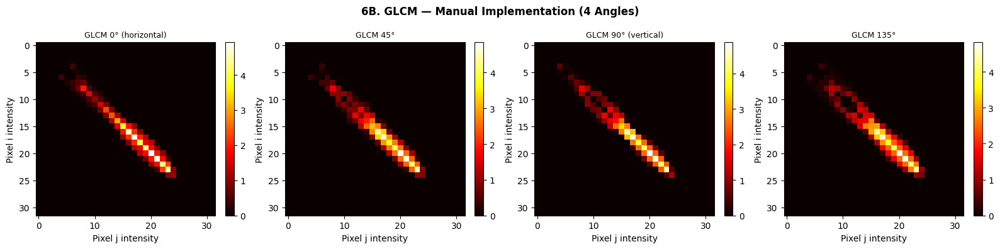

Saved: sec6b_glcm_demo.png

Extracting LBP for all 2900 images (resized to 64×64)...
  LBP: 500/2900 done  (89.1s)
  LBP: 1000/2900 done  (179.5s)
  LBP: 1500/2900 done  (268.1s)
  LBP: 2000/2900 done  (356.5s)
  LBP: 2500/2900 done  (445.1s)
LBP done in 516.5s  — shape: (2900, 59)

Extracting GLCM for all 2900 images (may take ~5–10 min)...
  GLCM: 100/2900 done  (2.2s, ~62s remaining)
  GLCM: 200/2900 done  (3.5s, ~47s remaining)
  GLCM: 300/2900 done  (4.7s, ~41s remaining)
  GLCM: 400/2900 done  (6.0s, ~38s remaining)
  GLCM: 500/2900 done  (7.3s, ~35s remaining)
  GLCM: 600/2900 done  (8.6s, ~33s remaining)
  GLCM: 700/2900 done  (9.8s, ~31s remaining)
  GLCM: 800/2900 done  (11.0s, ~29s remaining)
  GLCM: 900/2900 done  (12.4s, ~28s remaining)
  GLCM: 1000/2900 done  (14.8s, ~28s remaining)
  GLCM: 1100/2900 done  (16.7s, ~27s remaining)
  GLCM: 1200/2900 done  (17.9s, ~25s remaining)
  GLCM: 1300/2900 done  (19.1s, ~24s remaining)
  GLCM: 1400/2900 done  (20.4s, ~22s remaining)


In [11]:
def compute_glcm_features(image, n_levels=32, distances=[1], angles=None):
    """
    Manual GLCM texture features.
    Returns 1D float array of length 5 × len(distances) × len(angles).
    """
    if angles is None:
        angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
    img_q    = np.clip((image * (n_levels-1)).astype(np.int32), 0, n_levels-1)
    h, w     = img_q.shape
    features = []
    I_idx    = np.arange(n_levels)
    J_idx    = np.arange(n_levels)
    I, J     = np.meshgrid(I_idx, J_idx, indexing='ij')

    for d in distances:
        for angle in angles:
            dy = int(np.round(-d * np.sin(angle)))
            dx = int(np.round( d * np.cos(angle)))

            # Build co-occurrence matrix
            glcm = np.zeros((n_levels, n_levels), dtype=np.float64)
            for i in range(h):
                for j in range(w):
                    ni, nj = i + dy, j + dx
                    if 0 <= ni < h and 0 <= nj < w:
                        glcm[img_q[i,j], img_q[ni,nj]] += 1

            # Symmetrize & normalize
            glcm  = glcm + glcm.T
            total = glcm.sum()
            if total > 0:
                glcm /= total

            # Haralick features
            contrast = float(np.sum((I-J)**2 * glcm))
            dissim   = float(np.sum(np.abs(I-J) * glcm))
            homog    = float(np.sum(glcm / (1.0 + np.abs(I-J))))
            energy   = float(np.sum(glcm**2))
            mu_i     = float(np.sum(I * glcm))
            mu_j     = float(np.sum(J * glcm))
            sig_i    = float(np.sqrt(np.sum((I-mu_i)**2 * glcm) + 1e-10))
            sig_j    = float(np.sqrt(np.sum((J-mu_j)**2 * glcm) + 1e-10))
            corr     = float(np.sum((I-mu_i)*(J-mu_j)*glcm) / (sig_i*sig_j))
            features.extend([contrast, dissim, homog, energy, corr])

    return np.array(features, dtype=np.float64)

def _glcm_matrix_viz(image, angle=0, n_levels=32):
    img_q  = np.clip((image*(n_levels-1)).astype(np.int32), 0, n_levels-1)
    h, w   = img_q.shape
    dy     = int(np.round(-1*np.sin(angle)))
    dx     = int(np.round( 1*np.cos(angle)))
    glcm   = np.zeros((n_levels, n_levels))
    for i in range(h):
        for j in range(w):
            ni, nj = i+dy, j+dx
            if 0 <= ni < h and 0 <= nj < w:
                glcm[img_q[i,j], img_q[ni,nj]] += 1
    glcm = glcm + glcm.T
    return glcm / (glcm.sum() + 1e-10)

print('\nComputing GLCM on one 64×64 crop...')
t0        = time.time()
glcm_demo = compute_glcm_features(demo_crop, n_levels=32)
print(f'  GLCM feature length: {len(glcm_demo)}  ({time.time()-t0:.2f}s)')

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
fig.suptitle('6B. GLCM — Manual Implementation (4 Angles)', fontsize=12, fontweight='bold')
angle_labels = ['0° (horizontal)','45°','90° (vertical)','135°']
angle_vals   = [0, np.pi/4, np.pi/2, 3*np.pi/4]
for ax, angle, label in zip(axes, angle_vals, angle_labels):
    mat = _glcm_matrix_viz(demo_crop, angle=angle, n_levels=32)
    im  = ax.imshow(np.log1p(mat*1000), cmap='hot', aspect='auto')
    ax.set_title(f'GLCM {label}', fontsize=9)
    ax.set_xlabel('Pixel j intensity'); ax.set_ylabel('Pixel i intensity')
    plt.colorbar(im, ax=ax, fraction=0.046)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec6b_glcm_demo.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec6b_glcm_demo.png')


# ── Extract LBP + GLCM for ALL images ────────────────────────────────────────
# Resized to 64×64 before feature extraction — captures full texture pattern
# while avoiding excessive runtime from nested loops on 200×200 images.
# This is a deliberate design choice for speed; texture statistics are
# largely scale-invariant at this resolution.

LBP_SIZE = 64

print(f'\nExtracting LBP for all {len(final_images)} images (resized to {LBP_SIZE}×{LBP_SIZE})...')
t0           = time.time()
lbp_features = []
for i, img in enumerate(final_images):
    img_small = np.array(
        Image.fromarray((img*255).astype(np.uint8)).resize((LBP_SIZE,LBP_SIZE), Image.LANCZOS)
    ) / 255.0
    lbp_features.append(compute_lbp(img_small, P=8, R=1.0))
    if (i+1) % 500 == 0:
        print(f'  LBP: {i+1}/{len(final_images)} done  ({time.time()-t0:.1f}s)')
lbp_features = np.array(lbp_features)
print(f'LBP done in {time.time()-t0:.1f}s  — shape: {lbp_features.shape}')

print(f'\nExtracting GLCM for all {len(final_images)} images (may take ~5–10 min)...')
t0            = time.time()
glcm_features = []
for i, img in enumerate(final_images):
    img_small = np.array(
        Image.fromarray((img*255).astype(np.uint8)).resize((LBP_SIZE,LBP_SIZE), Image.LANCZOS)
    ) / 255.0
    glcm_features.append(compute_glcm_features(img_small, n_levels=32))
    if (i+1) % 100 == 0:
        elapsed = time.time()-t0
        eta     = elapsed/(i+1)*(len(final_images)-i-1)
        print(f'  GLCM: {i+1}/{len(final_images)} done  ({elapsed:.1f}s, ~{eta:.0f}s remaining)')
glcm_features = np.array(glcm_features)
print(f'GLCM done in {time.time()-t0:.1f}s  — shape: {glcm_features.shape}')

print(f'\nTraditional feature summary:')
print(f'  LBP  : {lbp_features.shape}  ({lbp_features.shape[1]} dims)')
print(f'  GLCM : {glcm_features.shape}  ({glcm_features.shape[1]} dims)')
print(f'  Total traditional: {lbp_features.shape[1] + glcm_features.shape[1]} dims')

# ════════════════════════════════════════════════════════════
#  SECTION 7 — CNN DEEP FEATURE EXTRACTION
#  VGG16 | VGG19 | ResNet50 | EfficientNetB0
#  Used as FEATURE EXTRACTORS ONLY — no fine-tuning, no training
# ════════════════════════════════════════════════════════════


  SECTION 7 — CNN Feature Extraction (Pre-trained Models)

  Building VGG16...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
  VGG16 ready — output: 512 features, all weights FROZEN
    VGG16: batch 10/91  (15.0s)
    VGG16: batch 20/91  (17.8s)
    VGG16: batch 30/91  (20.5s)
    VGG16: batch 40/91  (23.8s)
    VGG16: batch 50/91  (26.8s)
    VGG16: batch 60/91  (29.5s)
    VGG16: batch 70/91  (32.2s)
    VGG16: batch 80/91  (34.9s)
    VGG16: batch 90/91  (38.5s)
  VGG16 done in 47.4s — shape: (2900, 512)

  Building VGG19...
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
  VGG19 ready — output: 512 features, all weights FROZEN
    VGG19: batch 10/91  (4.5s)
    VGG19: batch 20/91  (7.5s)
    VGG19: batch 30/91  (10.5s)
    VGG19: batch 40/91  (13.6s)
    VGG19: batch 50/91  (17.3s)
    VGG19: batch 60/91  (20.4s)
    VGG19: batch 70/91  (23.5s)
    VGG19: batch 80/91  (26.5s)
    VGG19: batch 90/91  (30.1s)
  VGG19 done in 31.2s — shape: (2900, 512)

  Building ResNet50...

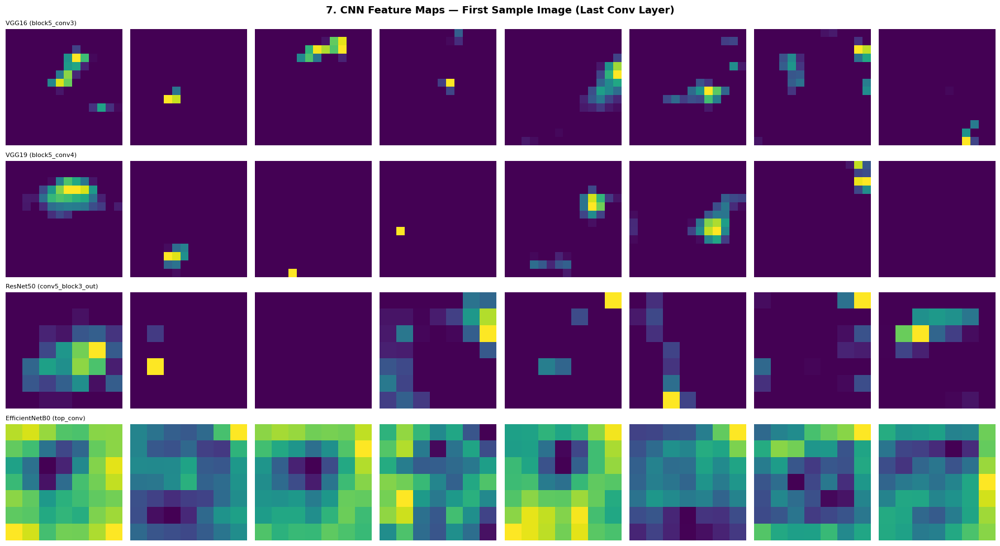

Saved: sec7_cnn_feature_maps.png

Quick accuracy preview (Logistic Regression, no PCA) per CNN architecture...
  VGG16               : 93.79%
  VGG19               : 92.93%
  ResNet50            : 93.10%
  EfficientNetB0      : 95.00%

  Best CNN architecture: EfficientNetB0  (95.00%)


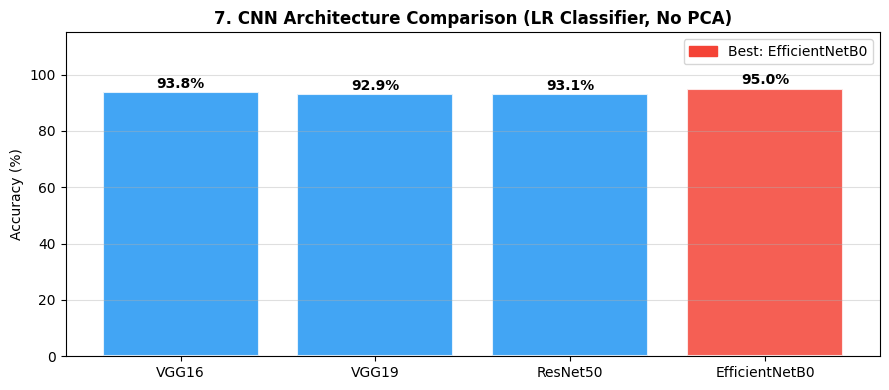

Saved: sec7_cnn_comparison.png


In [12]:
print('\n' + '='*65)
print('  SECTION 7 — CNN Feature Extraction (Pre-trained Models)')
print('='*65)

CNN_SIZE = 224   # standard input size for all 4 architectures

def prepare_cnn_batch(images, target_size, preprocess_fn):
    """Convert grayscale [0,1] → RGB [0,255] batch for CNN input."""
    batch = []
    for img in images:
        img_pil = Image.fromarray((img*255).astype(np.uint8)).resize(
                  (target_size, target_size), Image.LANCZOS)
        img_rgb = np.stack([np.array(img_pil)]*3, axis=-1).astype(np.float32)
        batch.append(img_rgb)
    batch = np.array(batch)
    return preprocess_fn(batch)

def build_feature_extractor(model_class, preprocess_fn, model_name):
    """Build CNN feature extractor using GlobalAveragePooling on final conv output."""
    print(f'\n  Building {model_name}...')
    base   = model_class(weights='imagenet', include_top=False, input_shape=(CNN_SIZE,CNN_SIZE,3))
    output = tf.keras.layers.GlobalAveragePooling2D()(base.output)
    model  = Model(inputs=base.input, outputs=output)
    model.trainable = False
    print(f'  {model_name} ready — output: {model.output_shape[1]} features, all weights FROZEN')
    return model

def extract_cnn_features(images, model, preprocess_fn, model_name, batch_size=32):
    """Extract features from all images in batches."""
    all_feats = []
    n_batches = int(np.ceil(len(images)/batch_size))
    t0 = time.time()
    for b in range(n_batches):
        batch_imgs = images[b*batch_size:(b+1)*batch_size]
        batch_prep = prepare_cnn_batch(batch_imgs, CNN_SIZE, preprocess_fn)
        feats      = model.predict(batch_prep, verbose=0)
        all_feats.append(feats)
        if (b+1) % 10 == 0:
            print(f'    {model_name}: batch {b+1}/{n_batches}  ({time.time()-t0:.1f}s)')
    features = np.concatenate(all_feats, axis=0)
    print(f'  {model_name} done in {time.time()-t0:.1f}s — shape: {features.shape}')
    return features

# Build & extract all 4 CNN architectures
cnn_configs = [
    ('VGG16',          VGG16,          vgg16_pre),
    ('VGG19',          VGG19,          vgg19_pre),
    ('ResNet50',       ResNet50,       resnet_pre),
    ('EfficientNetB0', EfficientNetB0, effnet_pre),
]

cnn_models   = {}
cnn_features = {}

for model_name, model_class, preprocess_fn in cnn_configs:
    model = build_feature_extractor(model_class, preprocess_fn, model_name)
    cnn_models[model_name]   = (model, preprocess_fn)
    cnn_features[model_name] = extract_cnn_features(final_images, model, preprocess_fn, model_name)

print('\nCNN extraction summary:')
for name, feats in cnn_features.items():
    print(f'  {name:20s}: {feats.shape}')

# Visualise CNN feature maps for one sample
def get_feature_maps(model_class, preprocess_fn, images, target_size=224):
    base  = model_class(weights='imagenet', include_top=False, input_shape=(target_size,target_size,3))
    layer_name = None
    for layer in reversed(base.layers):
        if 'conv' in layer.name:
            layer_name = layer.name
            break
    feat_model = Model(inputs=base.input, outputs=base.get_layer(layer_name).output)
    batch      = prepare_cnn_batch(images[:1], target_size, preprocess_fn)
    maps       = feat_model.predict(batch, verbose=0)
    return maps[0], layer_name

fig, axes = plt.subplots(4, 8, figsize=(18, 10))
fig.suptitle('7. CNN Feature Maps — First Sample Image (Last Conv Layer)', fontsize=13, fontweight='bold')
for row, (model_name, model_class, preprocess_fn) in enumerate(cnn_configs):
    maps, lname = get_feature_maps(model_class, preprocess_fn, final_images)
    for col in range(8):
        ch = col % maps.shape[-1]
        axes[row, col].imshow(maps[:,:,ch], cmap='viridis')
        axes[row, col].axis('off')
    axes[row, 0].set_ylabel(model_name, fontsize=9, rotation=90, labelpad=40)
    axes[row, 0].set_title(f'{model_name} ({lname})', fontsize=8, loc='left')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec7_cnn_feature_maps.png'), dpi=120, bbox_inches='tight')
plt.show()
print('Saved: sec7_cnn_feature_maps.png')

# Quick accuracy preview per CNN architecture (LR, no PCA) to select best
print('\nQuick accuracy preview (Logistic Regression, no PCA) per CNN architecture...')
cnn_quick_acc = {}
for model_name, feats in cnn_features.items():
    scaler  = StandardScaler()
    X_s     = scaler.fit_transform(feats)
    Xtr, Xte, ytr, yte = train_test_split(X_s, labels, test_size=0.2,
                                           random_state=RANDOM_SEED, stratify=labels)
    lr  = LogisticRegression(max_iter=1000, random_state=RANDOM_SEED)
    lr.fit(Xtr, ytr)
    acc = accuracy_score(yte, lr.predict(Xte))
    cnn_quick_acc[model_name] = acc
    print(f'  {model_name:20s}: {acc*100:.2f}%')

best_cnn_name = max(cnn_quick_acc, key=cnn_quick_acc.get)
print(f'\n  Best CNN architecture: {best_cnn_name}  ({cnn_quick_acc[best_cnn_name]*100:.2f}%)')

fig, ax = plt.subplots(figsize=(9, 4))
names  = list(cnn_quick_acc.keys())
accs   = [cnn_quick_acc[n]*100 for n in names]
colors = ['#F44336' if n == best_cnn_name else '#2196F3' for n in names]
bars   = ax.bar(names, accs, color=colors, alpha=0.85, edgecolor='white', linewidth=1.5)
for bar, acc in zip(bars, accs):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
            f'{acc:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
ax.set_title('7. CNN Architecture Comparison (LR Classifier, No PCA)', fontsize=12, fontweight='bold')
ax.set_ylabel('Accuracy (%)'); ax.set_ylim(0, 115); ax.grid(axis='y', alpha=0.4)
ax.legend(handles=[mpatches.Patch(color='#F44336', label=f'Best: {best_cnn_name}')], fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec7_cnn_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec7_cnn_comparison.png')

# ════════════════════════════════════════════════════════════
#  SECTION 8 — FEATURE FUSION (CNN + LBP + GLCM)
# ════════════════════════════════════════════════════════════



  SECTION 8 — Feature Fusion
  Best CNN (EfficientNetB0) :   1280 dims
  LBP (manual)             :     59 dims
  GLCM (manual)            :     20 dims
  ─────────────────────────────────────────
  Fused (concatenated)     :   1359 dims


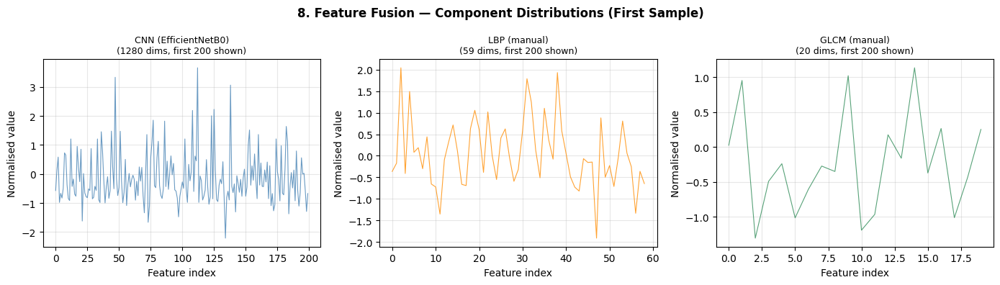

Saved: sec8_feature_fusion.png


In [13]:
print('\n' + '='*65)
print('  SECTION 8 — Feature Fusion')
print('='*65)

best_cnn_features = cnn_features[best_cnn_name]

# Normalize each modality independently before fusion
# (StandardScaler: zero mean, unit variance per feature)
scaler_cnn  = StandardScaler(); cnn_norm  = scaler_cnn.fit_transform(best_cnn_features)
scaler_lbp  = StandardScaler(); lbp_norm  = scaler_lbp.fit_transform(lbp_features)
scaler_glcm = StandardScaler(); glcm_norm = scaler_glcm.fit_transform(glcm_features)

X_fused = np.concatenate([cnn_norm, lbp_norm, glcm_norm], axis=1)

print(f'  Best CNN ({best_cnn_name}) : {cnn_norm.shape[1]:>6} dims')
print(f'  LBP (manual)             : {lbp_norm.shape[1]:>6} dims')
print(f'  GLCM (manual)            : {glcm_norm.shape[1]:>6} dims')
print(f'  ─────────────────────────────────────────')
print(f'  Fused (concatenated)     : {X_fused.shape[1]:>6} dims')

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
fig.suptitle('8. Feature Fusion — Component Distributions (First Sample)', fontsize=12, fontweight='bold')
for ax, feats, name, color in zip(axes,
    [cnn_norm[0], lbp_norm[0], glcm_norm[0]],
    [f'CNN ({best_cnn_name})', 'LBP (manual)', 'GLCM (manual)'],
    ['steelblue', 'darkorange', 'seagreen']):
    ax.plot(feats[:min(200,len(feats))], color=color, alpha=0.8, linewidth=0.8)
    ax.set_title(f'{name}\n({len(feats)} dims, first 200 shown)', fontsize=9)
    ax.set_xlabel('Feature index'); ax.set_ylabel('Normalised value'); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec8_feature_fusion.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec8_feature_fusion.png')

# ════════════════════════════════════════════════════════════
#  SECTION 9 — PCA REDUCTION ON FUSED FEATURES
#  Reusing ManualPCA from Section 5 (same class, no sklearn PCA)
# ════════════════════════════════════════════════════════════


  SECTION 9 — PCA Reduction on Fused Features (Manual PCA)

Applying Manual PCA: 1359 dims → 100 dims...
    Surrogate covariance shape : (2900, 2900)  (67 MB vs 0 GB for true covariance)
    Top-5 eigenvalues : [111.11  61.87  55.07  52.26  47.63]
PCA done in 6.5s
  Input  : (2900, 1359)
  Output : (2900, 100)
  Variance explained (100 PCs): 74.8%


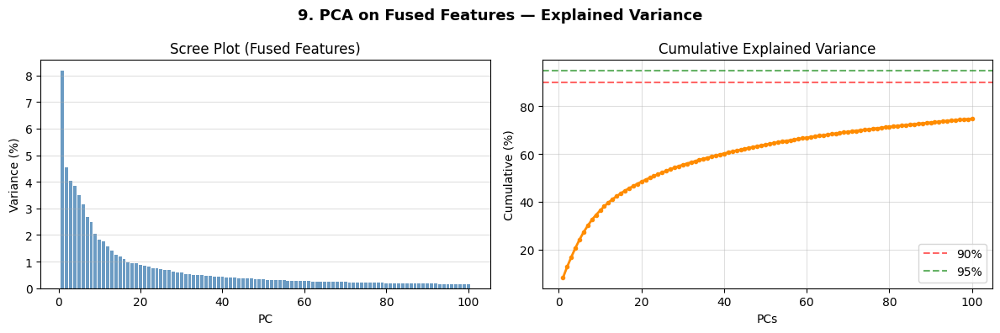

Saved: sec9_pca_fused.png


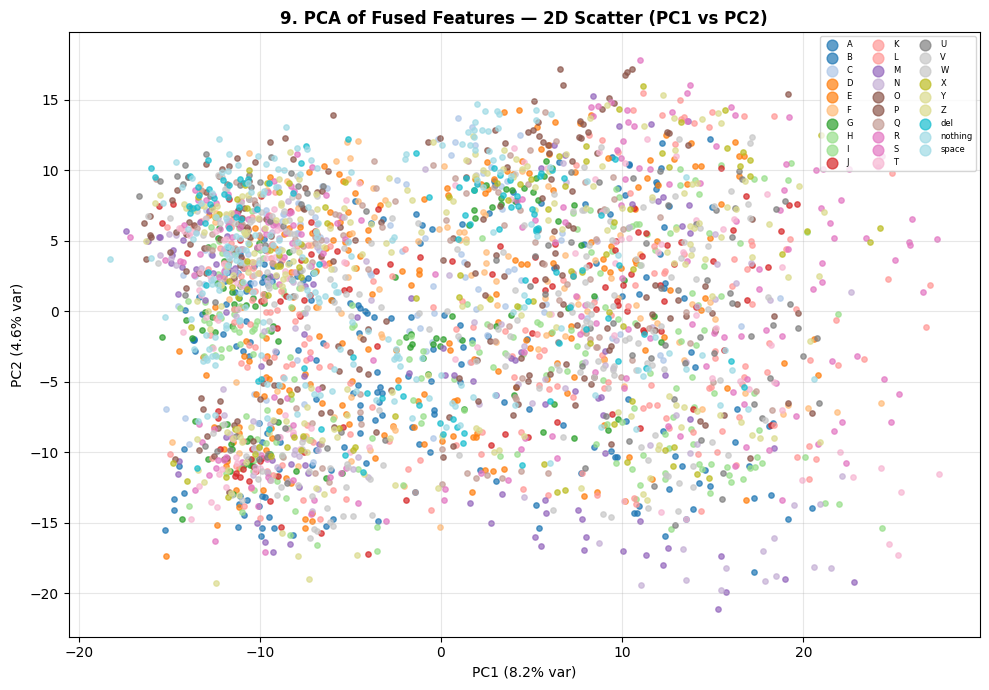

Saved: sec9_pca_scatter.png


In [14]:
print('\n' + '='*65)
print('  SECTION 9 — PCA Reduction on Fused Features (Manual PCA)')
print('='*65)

PCA_COMPONENTS_FUSED = 100

print(f'\nApplying Manual PCA: {X_fused.shape[1]} dims → {PCA_COMPONENTS_FUSED} dims...')
t0        = time.time()
pca_fused = ManualPCA(n_components=PCA_COMPONENTS_FUSED)
X_reduced = pca_fused.fit_transform(X_fused)
print(f'PCA done in {time.time()-t0:.1f}s')
print(f'  Input  : {X_fused.shape}')
print(f'  Output : {X_reduced.shape}')

cumvar_fused = np.cumsum(pca_fused.explained_variance_ratio_) * 100
indvar_fused = pca_fused.explained_variance_ratio_ * 100
print(f'  Variance explained ({PCA_COMPONENTS_FUSED} PCs): {cumvar_fused[-1]:.1f}%')

# Scree plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
fig.suptitle('9. PCA on Fused Features — Explained Variance', fontsize=13, fontweight='bold')
ax1.bar(range(1, PCA_COMPONENTS_FUSED+1), indvar_fused, color='steelblue', alpha=0.8)
ax1.set_title('Scree Plot (Fused Features)'); ax1.set_xlabel('PC'); ax1.set_ylabel('Variance (%)'); ax1.grid(axis='y', alpha=0.4)
ax2.plot(range(1, PCA_COMPONENTS_FUSED+1), cumvar_fused, 'o-', color='darkorange', lw=2, ms=3)
ax2.axhline(90, color='red',   ls='--', alpha=0.6, label='90%')
ax2.axhline(95, color='green', ls='--', alpha=0.6, label='95%')
idx95 = np.argmax(cumvar_fused >= 95)
if cumvar_fused[idx95] >= 95:
    ax2.axvline(idx95+1, color='green', ls=':', alpha=0.7)
    ax2.annotate(f'PC {idx95+1}\n95%', xy=(idx95+1, cumvar_fused[idx95]),
                 xytext=(idx95+5, cumvar_fused[idx95]-12), fontsize=9,
                 arrowprops=dict(arrowstyle='->', color='green'))
ax2.set_title('Cumulative Explained Variance'); ax2.set_xlabel('PCs'); ax2.set_ylabel('Cumulative (%)'); ax2.legend(); ax2.grid(alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec9_pca_fused.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec9_pca_fused.png')

# 2D PCA scatter plot
fig, ax = plt.subplots(figsize=(10, 7))
cmap_scatter = plt.get_cmap('tab20', len(CLASSES))
for cls_idx, cls_name in enumerate(CLASSES):
    mask = labels == cls_idx
    ax.scatter(X_reduced[mask,0], X_reduced[mask,1],
               c=[cmap_scatter(cls_idx)], label=cls_name, s=15, alpha=0.7)
ax.set_title('9. PCA of Fused Features — 2D Scatter (PC1 vs PC2)', fontsize=12, fontweight='bold')
ax.set_xlabel(f'PC1 ({indvar_fused[0]:.1f}% var)'); ax.set_ylabel(f'PC2 ({indvar_fused[1]:.1f}% var)')
ax.legend(loc='upper right', ncol=3, fontsize=6, markerscale=2); ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec9_pca_scatter.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec9_pca_scatter.png')

# ════════════════════════════════════════════════════════════
#  SECTION 10 — PROPOSED MODEL ARCHITECTURE DIAGRAM
#  NEW: Required by Phase II — full pipeline flowchart
# ════════════════════════════════════════════════════════════


Generating Proposed Model Architecture Diagram...


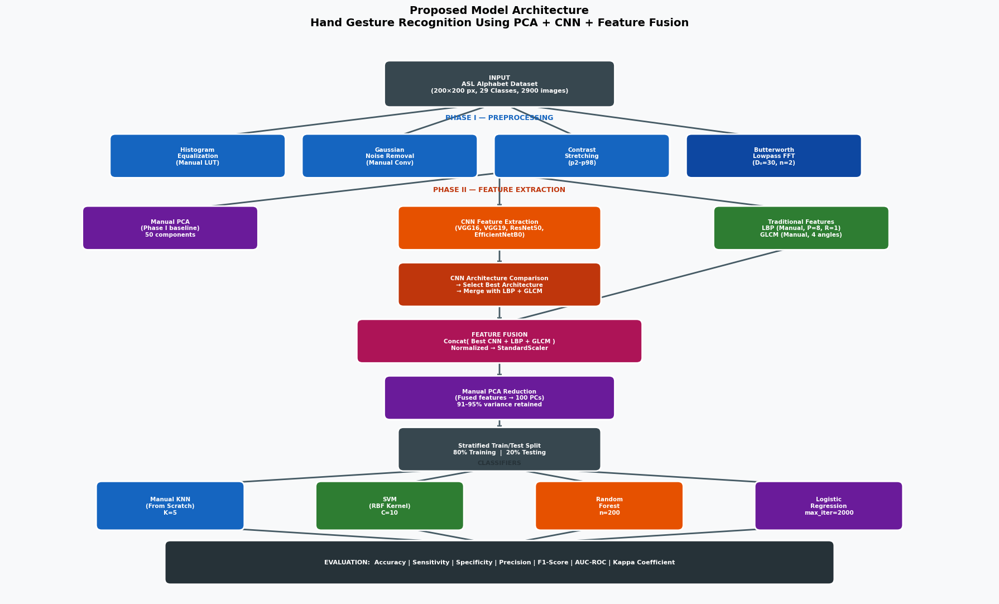

Saved: sec10_proposed_model_diagram.png


In [15]:
print('\nGenerating Proposed Model Architecture Diagram...')

fig, ax = plt.subplots(figsize=(18, 11))
ax.set_xlim(0, 18); ax.set_ylim(0, 11); ax.axis('off')
fig.patch.set_facecolor('#F8F9FA')
ax.set_facecolor('#F8F9FA')
fig.suptitle('Proposed Model Architecture\nHand Gesture Recognition Using PCA + CNN + Feature Fusion',
             fontsize=14, fontweight='bold', y=0.98)

def draw_box(ax, x, y, w, h, label, color='#2196F3', text_color='white', fontsize=9, style='round,pad=0.1'):
    box = mpatches.FancyBboxPatch((x-w/2, y-h/2), w, h,
                                   boxstyle=style, facecolor=color,
                                   edgecolor='white', linewidth=2, zorder=3)
    ax.add_patch(box)
    ax.text(x, y, label, ha='center', va='center', fontsize=fontsize,
            fontweight='bold', color=text_color, zorder=4, wrap=True,
            multialignment='center')

def draw_arrow(ax, x1, y1, x2, y2, label=''):
    ax.annotate('', xy=(x2, y2), xytext=(x1, y1),
                arrowprops=dict(arrowstyle='->', color='#455A64', lw=2), zorder=2)
    if label:
        mx, my = (x1+x2)/2, (y1+y2)/2
        ax.text(mx+0.1, my, label, fontsize=7, color='#455A64', va='center')

# Row 1: Input
draw_box(ax, 9, 10.0, 4, 0.7, 'INPUT\nASL Alphabet Dataset\n(200×200 px, 29 Classes, 2900 images)',
         color='#37474F', fontsize=8)

# Row 2: Preprocessing
draw_box(ax, 3.5, 8.6, 3, 0.65, 'Histogram\nEqualization\n(Manual LUT)', color='#1565C0', fontsize=7.5)
draw_box(ax, 7,   8.6, 3, 0.65, 'Gaussian\nNoise Removal\n(Manual Conv)', color='#1565C0', fontsize=7.5)
draw_box(ax, 10.5,8.6, 3, 0.65, 'Contrast\nStretching\n(p2–p98)', color='#1565C0', fontsize=7.5)
draw_box(ax, 14,  8.6, 3, 0.65, 'Butterworth\nLowpass FFT\n(D₀=30, n=2)', color='#0D47A1', fontsize=7.5)
ax.text(9, 9.35, 'PHASE I — PREPROCESSING', ha='center', va='center',
        fontsize=9, fontweight='bold', color='#1565C0')

# Arrows: input to preprocessing
for bx in [3.5, 7, 10.5, 14]:
    draw_arrow(ax, 9, 9.65, bx, 8.93)

# Row 3: Feature extraction (3 paths)
draw_box(ax, 3, 7.2, 3, 0.65, 'Manual PCA\n(Phase I baseline)\n50 components',
         color='#6A1B9A', fontsize=7.5)
draw_box(ax, 9, 7.2, 3.5, 0.65, 'CNN Feature Extraction\n(VGG16, VGG19, ResNet50,\nEfficientNetB0)',
         color='#E65100', fontsize=7.5)
draw_box(ax, 14.5, 7.2, 3, 0.65, 'Traditional Features\nLBP (Manual, P=8, R=1)\nGLCM (Manual, 4 angles)',
         color='#2E7D32', fontsize=7.5)
ax.text(9, 7.95, 'PHASE II — FEATURE EXTRACTION', ha='center', va='center',
        fontsize=9, fontweight='bold', color='#BF360C')

for bx in [3, 9, 14.5]:
    for src in [3.5, 7, 10.5, 14]:
        pass  # just connect from the preprocessed output
draw_arrow(ax, 9, 8.27, 3, 7.53)
draw_arrow(ax, 9, 8.27, 9, 7.53)
draw_arrow(ax, 9, 8.27, 14.5, 7.53)

# Row 4: CNN architecture comparison box
draw_box(ax, 9, 6.1, 3.5, 0.65,
         'CNN Architecture Comparison\n→ Select Best Architecture\n→ Merge with LBP + GLCM',
         color='#BF360C', fontsize=7.5)
draw_arrow(ax, 9, 6.87, 9, 6.43)

# Row 4b: Feature Fusion
draw_box(ax, 9, 5.0, 5, 0.65,
         'FEATURE FUSION\nConcat( Best CNN + LBP + GLCM )\nNormalized → StandardScaler',
         color='#AD1457', fontsize=7.5)
draw_arrow(ax, 9, 5.77, 9, 5.33)
draw_arrow(ax, 14.5, 6.87, 9, 5.33)

# Row 5: PCA reduction
draw_box(ax, 9, 3.9, 4, 0.65,
         'Manual PCA Reduction\n(Fused features → 100 PCs)\n91–95% variance retained',
         color='#6A1B9A', fontsize=7.5)
draw_arrow(ax, 9, 4.67, 9, 4.23)

# Row 6: Train/Test split
draw_box(ax, 9, 2.9, 3.5, 0.65,
         'Stratified Train/Test Split\n80% Training  |  20% Testing',
         color='#37474F', fontsize=7.5)
draw_arrow(ax, 9, 3.57, 9, 3.23)

# Row 7: Classifiers
for i, (bx, name, clr) in enumerate([
        (3,  'Manual KNN\n(From Scratch)\nK=5', '#1565C0'),
        (7,  'SVM\n(RBF Kernel)\nC=10', '#2E7D32'),
        (11, 'Random\nForest\nn=200', '#E65100'),
        (15, 'Logistic\nRegression\nmax_iter=2000', '#6A1B9A')]):
    draw_box(ax, bx, 1.8, 2.5, 0.75, name, color=clr, fontsize=7.5)
    draw_arrow(ax, 9, 2.57, bx, 2.18)
ax.text(9, 2.58, 'CLASSIFIERS', ha='center', va='bottom', fontsize=8, fontweight='bold', color='#263238')

# Row 8: Evaluation
draw_box(ax, 9, 0.7, 12, 0.65,
         'EVALUATION:  Accuracy | Sensitivity | Specificity | Precision | F1-Score | AUC-ROC | Kappa Coefficient',
         color='#263238', fontsize=8)
for bx in [3, 7, 11, 15]:
    draw_arrow(ax, bx, 1.43, 9, 1.03)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec10_proposed_model_diagram.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec10_proposed_model_diagram.png')



# ════════════════════════════════════════════════════════════
#  SECTION 11 — DATA SPLITTING (TRAIN / TEST)
# ════════════════════════════════════════════════════════════




  SECTION 11 — Train / Test Split (Stratified 80/20)
  Total samples : 2900
  Train         : (2320, 100)  (2320 images, 100 PCA features)
  Test          : (580, 100)   (580 images)
  Classes       : 29


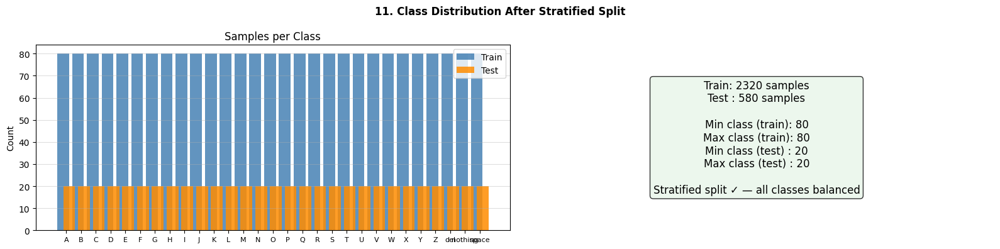

Stratification confirmed: every class has 20–20 test samples.


In [16]:
print('\n' + '='*65)
print('  SECTION 11 — Train / Test Split (Stratified 80/20)')
print('='*65)

X_train, X_test, y_train, y_test = train_test_split(
    X_reduced, labels,
    test_size    = 0.2,
    random_state = RANDOM_SEED,
    stratify     = labels
)
print(f'  Total samples : {len(X_reduced)}')
print(f'  Train         : {X_train.shape}  ({len(X_train)} images, {X_train.shape[1]} PCA features)')
print(f'  Test          : {X_test.shape}   ({len(X_test)} images)')
print(f'  Classes       : {len(np.unique(labels))}')

# Class balance verification
train_counts = np.bincount(y_train, minlength=len(CLASSES))
test_counts  = np.bincount(y_test,  minlength=len(CLASSES))

fig, axes = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('11. Class Distribution After Stratified Split', fontsize=12, fontweight='bold')
x = np.arange(len(CLASSES)); w = 0.4
axes[0].bar(x, train_counts, color='steelblue', alpha=0.85, label='Train')
axes[0].bar(x+w, test_counts, color='darkorange', alpha=0.85, label='Test')
axes[0].set_xticks(x+w/2); axes[0].set_xticklabels(CLASSES, fontsize=8)
axes[0].set_title('Samples per Class'); axes[0].set_ylabel('Count'); axes[0].legend(); axes[0].grid(axis='y', alpha=0.4)
axes[1].text(0.5, 0.5,
    f'Train: {len(X_train)} samples\n'
    f'Test : {len(X_test)} samples\n\n'
    f'Min class (train): {train_counts.min()}\n'
    f'Max class (train): {train_counts.max()}\n'
    f'Min class (test) : {test_counts.min()}\n'
    f'Max class (test) : {test_counts.max()}\n\n'
    f'Stratified split ✓ — all classes balanced',
    transform=axes[1].transAxes, ha='center', va='center', fontsize=12,
    bbox=dict(boxstyle='round', facecolor='#e8f5e9', alpha=0.8))
axes[1].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec11_class_distribution.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f'Stratification confirmed: every class has {test_counts.min()}–{test_counts.max()} test samples.')

# ════════════════════════════════════════════════════════════
#  SECTION 12 — CLASSIFICATION
#  12A: Manual KNN | 12B: SVM | 12C: Random Forest | 12D: LR
# ════════════════════════════════════════════════════════════


  SECTION 12 — Classification

  12A: Manual KNN (K=5)...
  Done in 0.4s

  KNN K-sweep (1, 3, 5, 7, 10, 15)...
    K= 1 → 89.14%
    K= 3 → 83.62%
    K= 5 → 82.24%
    K= 7 → 81.90%
    K=10 → 81.55%
    K=15 → 78.79%


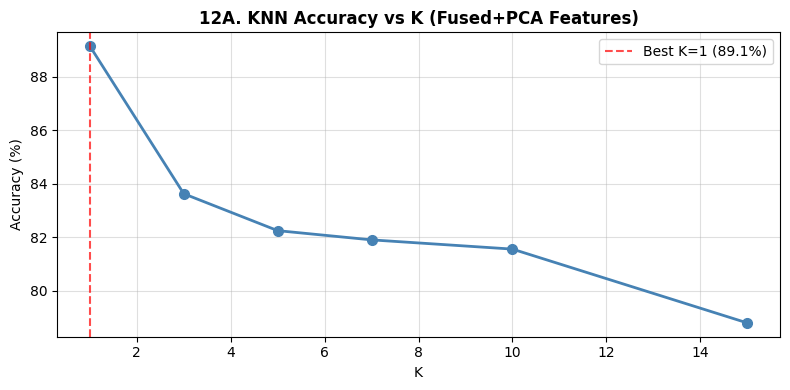

  Best K = 1  →  89.14%
  Saved: sec12a_knn_k_sweep.png

  12B: SVM (RBF, C=10)...
  Done in 2.8s

  12C: Random Forest (n=200)...
  Done in 7.2s

  12D: Logistic Regression (max_iter=2000)...
  Done in 3.0s

  All classifiers done. Quick accuracy summary:
    KNN (manual, K=5)           : 82.24%
    SVM (RBF)                   : 95.00%
    Random Forest               : 90.52%
    Logistic Regression         : 94.31%


In [17]:
print('\n' + '='*65)
print('  SECTION 12 — Classification')
print('='*65)

n_classes = len(CLASSES)


# ── 12A. Manual KNN (From Scratch — no sklearn) ───────────────────────────────

class ManualKNN:
    """
    K-Nearest Neighbors from scratch — NumPy only.
    No sklearn.neighbors.KNeighborsClassifier.
    Algorithm: memorize training data; at predict time compute Euclidean
    distance to every training sample and return majority vote of K nearest.
    """
    def __init__(self, n_neighbors=5, n_classes=None):
        self.k         = n_neighbors
        self.n_classes = n_classes
        self.X_train   = None
        self.y_train   = None

    def fit(self, X, y):
        self.X_train = X.copy()
        self.y_train = y.copy()
        if self.n_classes is None:
            self.n_classes = len(np.unique(y))
        return self

    def predict_single(self, x):
        # ||a-b||² = ||a||² + ||b||² - 2a·b  (vectorised, no loop over training set)
        diff   = self.X_train - x
        dists  = np.sqrt((diff**2).sum(axis=1))
        idx    = np.argsort(dists)[:self.k]
        counts = np.bincount(self.y_train[idx], minlength=self.n_classes)
        return int(np.argmax(counts))

    def predict(self, X_test):
        return np.array([self.predict_single(x) for x in X_test])


predictions  = {}
train_times  = {}
classifiers  = {}

# 12A: Manual KNN
print('\n  12A: Manual KNN (K=5)...')
t0  = time.time()
knn = ManualKNN(n_neighbors=5, n_classes=n_classes)
knn.fit(X_train, y_train)
predictions['KNN (manual, K=5)'] = knn.predict(X_test)
train_times['KNN (manual, K=5)'] = time.time() - t0
print(f'  Done in {train_times["KNN (manual, K=5)"]:.1f}s')

# K-sweep for KNN
print('\n  KNN K-sweep (1, 3, 5, 7, 10, 15)...')
k_range   = [1, 3, 5, 7, 10, 15]
k_results = []
for k in k_range:
    clf = ManualKNN(n_neighbors=k, n_classes=n_classes)
    clf.fit(X_train, y_train)
    a = accuracy_score(y_test, clf.predict(X_test))
    k_results.append(a)
    print(f'    K={k:2d} → {a*100:.2f}%')
best_k   = k_range[np.argmax(k_results)]
best_k_acc = max(k_results)*100
fig, ax = plt.subplots(figsize=(8, 4))
ax.plot(k_range, [r*100 for r in k_results], 'o-', color='steelblue', lw=2, ms=7)
ax.axvline(best_k, color='red', ls='--', alpha=0.7, label=f'Best K={best_k} ({best_k_acc:.1f}%)')
ax.set_title('12A. KNN Accuracy vs K (Fused+PCA Features)', fontsize=12, fontweight='bold')
ax.set_xlabel('K'); ax.set_ylabel('Accuracy (%)'); ax.legend(); ax.grid(alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec12a_knn_k_sweep.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f'  Best K = {best_k}  →  {best_k_acc:.2f}%')
print('  Saved: sec12a_knn_k_sweep.png')

# 12B: SVM
print('\n  12B: SVM (RBF, C=10)...')
t0  = time.time()
svm = SVC(kernel='rbf', C=10, gamma='scale', probability=True, random_state=RANDOM_SEED)
svm.fit(X_train, y_train)
predictions['SVM (RBF)']   = svm.predict(X_test)
train_times['SVM (RBF)']   = time.time() - t0
classifiers['SVM (RBF)']   = svm
print(f'  Done in {train_times["SVM (RBF)"]:.1f}s')

# 12C: Random Forest
print('\n  12C: Random Forest (n=200)...')
t0 = time.time()
rf = RandomForestClassifier(n_estimators=200, max_depth=None, random_state=RANDOM_SEED, n_jobs=-1)
rf.fit(X_train, y_train)
predictions['Random Forest']  = rf.predict(X_test)
train_times['Random Forest']  = time.time() - t0
classifiers['Random Forest']  = rf
print(f'  Done in {train_times["Random Forest"]:.1f}s')

# 12D: Logistic Regression
print('\n  12D: Logistic Regression (max_iter=2000)...')
t0 = time.time()
lr = LogisticRegression(max_iter=2000, C=1.0, random_state=RANDOM_SEED, n_jobs=-1)
lr.fit(X_train, y_train)
predictions['Logistic Regression'] = lr.predict(X_test)
train_times['Logistic Regression'] = time.time() - t0
classifiers['Logistic Regression'] = lr
print(f'  Done in {train_times["Logistic Regression"]:.1f}s')

print('\n  All classifiers done. Quick accuracy summary:')
for name, pred in predictions.items():
    print(f'    {name:<28}: {accuracy_score(y_test, pred)*100:.2f}%')

# ════════════════════════════════════════════════════════════
#  SECTION 13 — FULL EVALUATION METRICS
# ════════════════════════════════════════════════════════════

In [18]:
print('\n' + '='*65)
print('  SECTION 13 — Evaluation Metrics')
print('='*65)

y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))

def compute_specificity(y_true, y_pred, n_cls):
    """Macro-averaged specificity = TN/(TN+FP) averaged over all classes (one-vs-rest)."""
    specs = []
    for c in range(n_cls):
        true_bin = (y_true == c).astype(int)
        pred_bin = (y_pred == c).astype(int)
        TN = ((true_bin==0) & (pred_bin==0)).sum()
        FP = ((true_bin==0) & (pred_bin==1)).sum()
        specs.append(TN / (TN + FP + 1e-10))
    return float(np.mean(specs))

def compute_auc_roc(clf_name, model, X_te, y_te_bin):
    """Macro-averaged AUC-ROC. KNN uses distance-based soft probability estimates."""
    if clf_name == 'KNN (manual, K=5)':
        proba = np.zeros((len(X_te), n_classes))
        for i, x in enumerate(X_te):
            diff    = knn.X_train - x
            dists   = np.maximum(np.sqrt((diff**2).sum(axis=1)), 1e-10)
            weights = 1.0 / dists
            for w, lbl in zip(weights, knn.y_train):
                proba[i, lbl] += w
            proba[i] /= proba[i].sum()
    else:
        proba = model.predict_proba(X_te)
    try:
        return roc_auc_score(y_te_bin, proba, multi_class='ovr', average='macro')
    except Exception:
        return float('nan')

results = {}
for clf_name, y_pred in predictions.items():
    model  = classifiers.get(clf_name, knn)
    acc    = accuracy_score(y_test, y_pred)
    sens   = recall_score(y_test, y_pred, average='macro', zero_division=0)
    spec   = compute_specificity(y_test, y_pred, n_classes)
    prec   = precision_score(y_test, y_pred, average='macro', zero_division=0)
    f1     = f1_score(y_test, y_pred, average='macro', zero_division=0)
    kappa  = cohen_kappa_score(y_test, y_pred)
    auc    = compute_auc_roc(clf_name, model, X_test, y_test_bin)

    results[clf_name] = {
        'Accuracy': acc, 'Sensitivity': sens, 'Specificity': spec,
        'Precision': prec, 'F1-Score': f1, 'AUC-ROC': auc, 'Kappa': kappa,
    }
    print(f'\n  ── {clf_name} ──')
    for metric, val in results[clf_name].items():
        print(f'    {metric:<16}: {val*100:.2f}%' if metric != 'AUC-ROC' and metric != 'Kappa'
              else f'    {metric:<16}: {val:.4f}')

best_clf = max(results, key=lambda k: results[k]['Accuracy'])
print(f'\n  ★ Best classifier: {best_clf}  ({results[best_clf]["Accuracy"]*100:.2f}% accuracy)')


  SECTION 13 — Evaluation Metrics

  ── KNN (manual, K=5) ──
    Accuracy        : 82.24%
    Sensitivity     : 82.24%
    Specificity     : 99.37%
    Precision       : 82.53%
    F1-Score        : 82.03%
    AUC-ROC         : 0.9814
    Kappa           : 0.8161

  ── SVM (RBF) ──
    Accuracy        : 95.00%
    Sensitivity     : 95.00%
    Specificity     : 99.82%
    Precision       : 95.18%
    F1-Score        : 94.99%
    AUC-ROC         : 0.9989
    Kappa           : 0.9482

  ── Random Forest ──
    Accuracy        : 90.52%
    Sensitivity     : 90.52%
    Specificity     : 99.66%
    Precision       : 90.87%
    F1-Score        : 90.48%
    AUC-ROC         : 0.9928
    Kappa           : 0.9018

  ── Logistic Regression ──
    Accuracy        : 94.31%
    Sensitivity     : 94.31%
    Specificity     : 99.80%
    Precision       : 94.45%
    F1-Score        : 94.24%
    AUC-ROC         : 0.9986
    Kappa           : 0.9411

  ★ Best classifier: SVM (RBF)  (95.00% accuracy)


# ════════════════════════════════════════════════════════════
#  SECTION 14 — COMPARISON TABLES & FIGURES
# ════════════════════════════════════════════════════════════


  SECTION 14 — Comparison Tables & Figures

  FULL RESULTS TABLE:
  Classifier                       Accuracy  Sensitivity  Specificity    Precision     F1-Score      AUC-ROC        Kappa
  -----------------------------------------------------------------------------------------------------------------------
  KNN (manual, K=5)                  82.24%       82.24%       99.37%       82.53%       82.03%       0.9814       0.8161
  SVM (RBF)                          95.00%       95.00%       99.82%       95.18%       94.99%       0.9989       0.9482 ★
  Random Forest                      90.52%       90.52%       99.66%       90.87%       90.48%       0.9928       0.9018
  Logistic Regression                94.31%       94.31%       99.80%       94.45%       94.24%       0.9986       0.9411


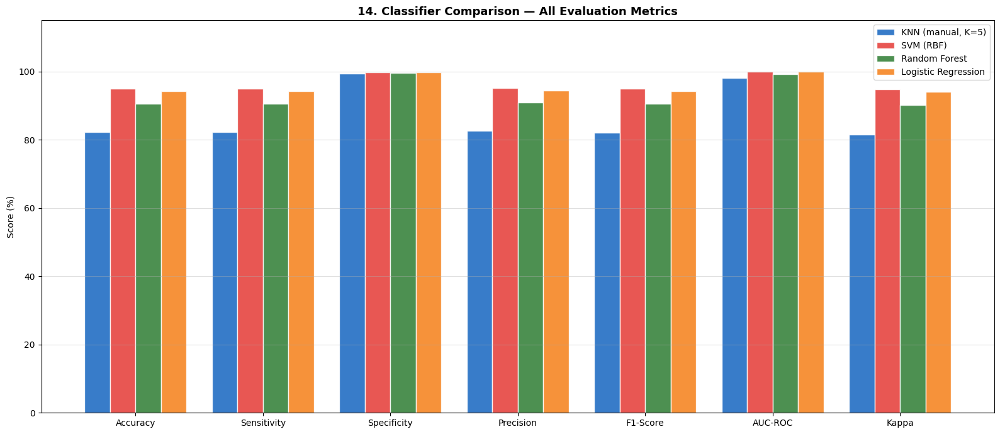

Saved: sec14_metrics_comparison.png


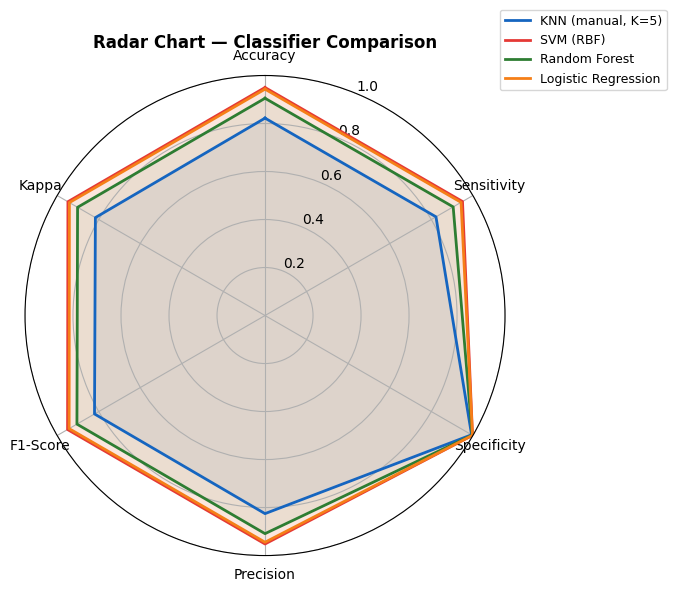

Saved: sec14_radar_chart.png


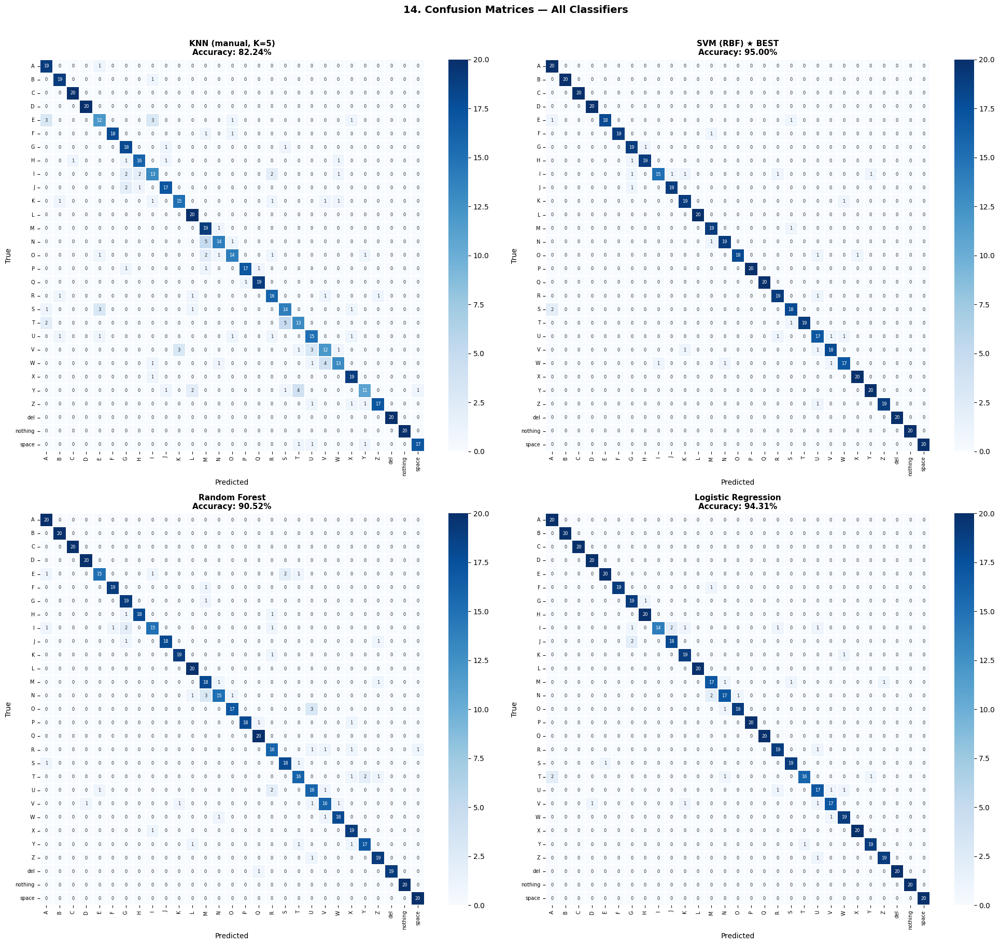

Saved: sec14_confusion_matrices.png


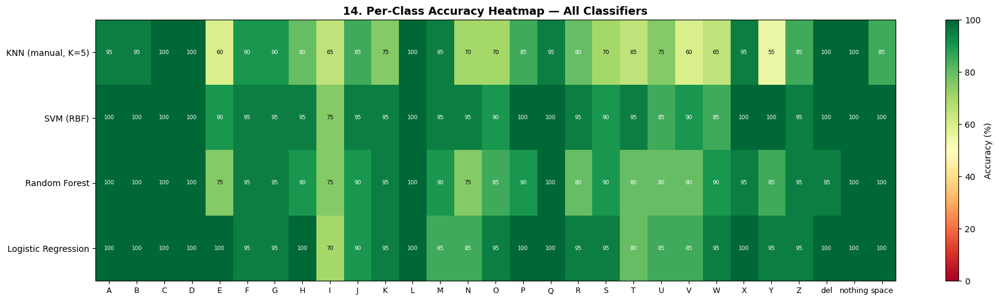

Saved: sec14_per_class_heatmap.png


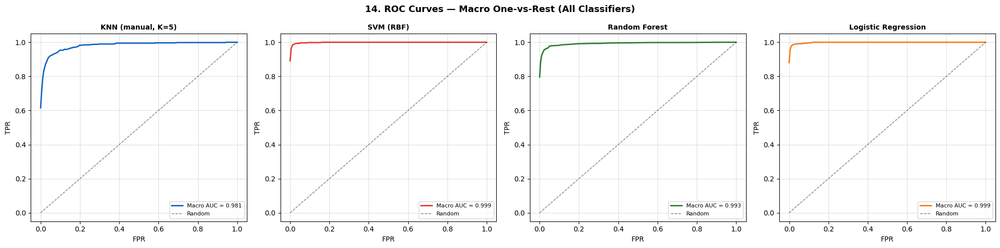

Saved: sec14_roc_curves.png  (all 4 classifiers, including KNN)


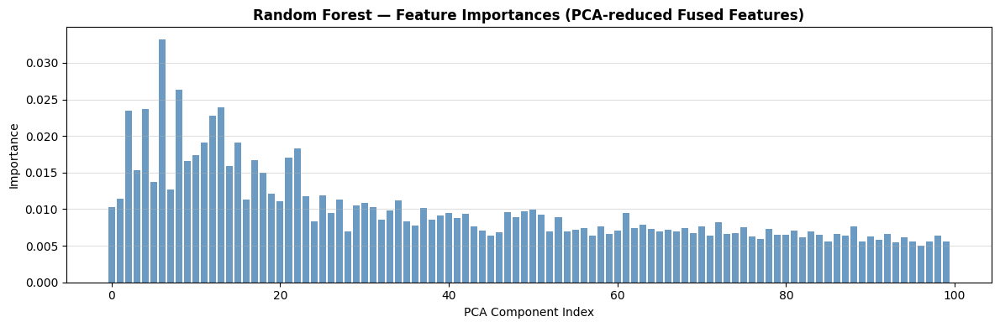

Saved: sec14_rf_feature_importance.png


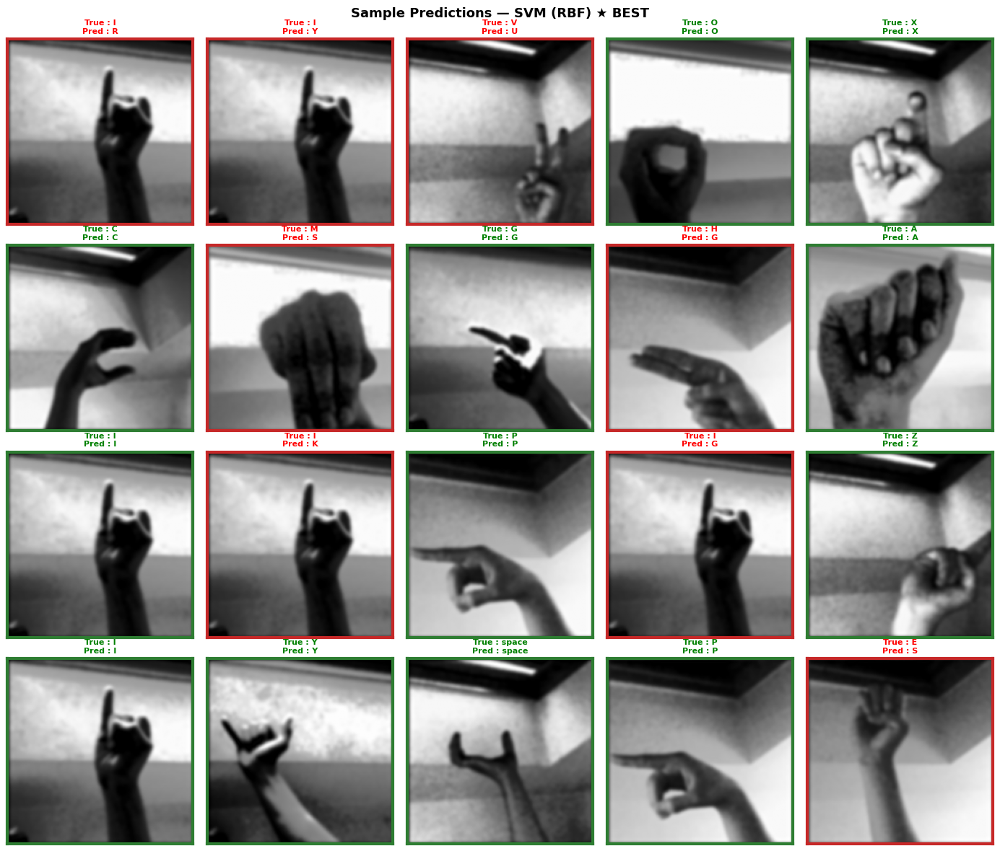

Saved: sec14_sample_predictions.png


In [19]:
print('\n' + '='*65)
print('  SECTION 14 — Comparison Tables & Figures')
print('='*65)

metrics_order = ['Accuracy','Sensitivity','Specificity','Precision','F1-Score','AUC-ROC','Kappa']
clf_colors    = ['#1565C0','#E53935','#2E7D32','#F57F17']

# Table printout
print('\n  FULL RESULTS TABLE:')
header = f"  {'Classifier':<28}" + ''.join(f'{m:>13}' for m in metrics_order)
print(header); print('  ' + '-'*(len(header)-2))
for clf_name, res in results.items():
    star = ' ★' if clf_name == best_clf else ''
    row  = f"  {clf_name:<28}" + ''.join(
        f'{res[m]*100:>12.2f}%' if m not in ['AUC-ROC','Kappa'] else f'{res[m]:>13.4f}'
        for m in metrics_order)
    print(row + star)

# Figure 1: Grouped bar chart
fig, ax = plt.subplots(figsize=(16, 7))
x         = np.arange(len(metrics_order))
bar_width = 0.2
n_clfs    = len(results)
offsets   = np.linspace(-(n_clfs-1)/2, (n_clfs-1)/2, n_clfs) * bar_width
for i, (clf_name, res) in enumerate(results.items()):
    vals = [res[m]*100 for m in metrics_order]
    ax.bar(x + offsets[i], vals, bar_width, label=clf_name,
           color=clf_colors[i], alpha=0.85, edgecolor='white')
ax.set_xticks(x); ax.set_xticklabels(metrics_order, fontsize=10)
ax.set_ylabel('Score (%)'); ax.set_ylim(0, 115)
ax.set_title('14. Classifier Comparison — All Evaluation Metrics', fontsize=13, fontweight='bold')
ax.legend(fontsize=10); ax.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_metrics_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_metrics_comparison.png')

# Figure 2: Radar chart
metrics_radar = ['Accuracy','Sensitivity','Specificity','Precision','F1-Score','Kappa']
N_r           = len(metrics_radar)
angles        = np.linspace(0, 2*np.pi, N_r, endpoint=False).tolist(); angles += angles[:1]
fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))
ax.set_theta_offset(np.pi/2); ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles[:-1]), metrics_radar)
for i, (clf_name, res) in enumerate(results.items()):
    vals  = [res[m] for m in metrics_radar]; vals += vals[:1]
    ax.plot(angles, vals, lw=2, label=clf_name, color=clf_colors[i])
    ax.fill(angles, vals, alpha=0.08, color=clf_colors[i])
ax.set_ylim(0, 1)
ax.set_title('Radar Chart — Classifier Comparison', fontsize=12, fontweight='bold', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1.35, 1.15), fontsize=9)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_radar_chart.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_radar_chart.png')

# Figure 3: Confusion matrices (2×2 grid)
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
axes = axes.flatten()
for ax, (clf_name, y_pred) in zip(axes, predictions.items()):
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=CLASSES, yticklabels=CLASSES,
                cmap='Blues', linewidths=0.3, ax=ax, annot_kws={'size': 6})
    star = ' ★ BEST' if clf_name == best_clf else ''
    ax.set_title(f'{clf_name}{star}\nAccuracy: {results[clf_name]["Accuracy"]*100:.2f}%',
                 fontsize=11, fontweight='bold')
    ax.set_xlabel('Predicted'); ax.set_ylabel('True'); ax.tick_params(labelsize=7)
plt.suptitle('14. Confusion Matrices — All Classifiers', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_confusion_matrices.png'), dpi=120, bbox_inches='tight')
plt.show()
print('Saved: sec14_confusion_matrices.png')

# Figure 4: Per-class accuracy heatmap
per_class_acc_matrix = []
for clf_name, y_pred in predictions.items():
    cm     = confusion_matrix(y_test, y_pred)
    pc_acc = cm.diagonal() / cm.sum(axis=1)
    per_class_acc_matrix.append(pc_acc)
per_class_acc_matrix = np.array(per_class_acc_matrix) * 100

fig, ax = plt.subplots(figsize=(18, 5))
im = ax.imshow(per_class_acc_matrix, aspect='auto', cmap='RdYlGn', vmin=0, vmax=100)
ax.set_xticks(range(len(CLASSES))); ax.set_xticklabels(CLASSES, fontsize=9)
ax.set_yticks(range(len(predictions))); ax.set_yticklabels(list(predictions.keys()), fontsize=10)
plt.colorbar(im, ax=ax, label='Accuracy (%)')
ax.set_title('14. Per-Class Accuracy Heatmap — All Classifiers', fontsize=13, fontweight='bold')
for i in range(len(predictions)):
    for j in range(len(CLASSES)):
        v = per_class_acc_matrix[i, j]
        ax.text(j, i, f'{v:.0f}', ha='center', va='center',
                fontsize=6.5, color='black' if 30 < v < 80 else 'white')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_per_class_heatmap.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_per_class_heatmap.png')

# Figure 5: ROC curves (macro OvR) — SVM, RF, LR, AND KNN (new: all 4)
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('14. ROC Curves — Macro One-vs-Rest (All Classifiers)', fontsize=13, fontweight='bold')
roc_clfs = [
    ('KNN (manual, K=5)', knn,  None),
    ('SVM (RBF)',  classifiers['SVM (RBF)'],  None),
    ('Random Forest', classifiers['Random Forest'], None),
    ('Logistic Regression', classifiers['Logistic Regression'], None),
]
for ax, (clf_name, model, _), color in zip(axes, roc_clfs, clf_colors):
    # Get probabilities
    if clf_name == 'KNN (manual, K=5)':
        proba = np.zeros((len(X_test), n_classes))
        for i, x in enumerate(X_test):
            diff    = knn.X_train - x
            dists   = np.maximum(np.sqrt((diff**2).sum(axis=1)), 1e-10)
            weights = 1.0 / dists
            for w, lbl in zip(weights, knn.y_train):
                proba[i, lbl] += w
            proba[i] /= proba[i].sum()
    else:
        proba = model.predict_proba(X_test)
    # Macro-average ROC
    all_fpr = np.linspace(0, 1, 200)
    tprs    = []
    for c in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_bin[:, c], proba[:, c])
        tprs.append(np.interp(all_fpr, fpr, tpr))
    mean_tpr  = np.mean(tprs, axis=0)
    macro_auc = auc_fn(all_fpr, mean_tpr)
    ax.plot(all_fpr, mean_tpr, lw=2, color=color, label=f'Macro AUC = {macro_auc:.3f}')
    ax.plot([0,1],[0,1],'k--', lw=1, alpha=0.5, label='Random')
    ax.set_title(clf_name, fontsize=10, fontweight='bold')
    ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
    ax.legend(fontsize=8); ax.grid(alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_roc_curves.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_roc_curves.png  (all 4 classifiers, including KNN)')

# Figure 6: Random Forest feature importance
importances = rf.feature_importances_
fig, ax = plt.subplots(figsize=(12, 4))
ax.bar(range(len(importances)), importances, color='steelblue', alpha=0.8)
ax.set_title('Random Forest — Feature Importances (PCA-reduced Fused Features)',
             fontsize=12, fontweight='bold')
ax.set_xlabel('PCA Component Index'); ax.set_ylabel('Importance'); ax.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_rf_feature_importance.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_rf_feature_importance.png')

# Figure 7: Sample predictions visualisation (best classifier)
best_preds = predictions[best_clf]
n_show     = 20
wrong_idx   = np.where(best_preds != y_test)[0]
correct_idx = np.where(best_preds == y_test)[0]
show_idx    = np.concatenate([wrong_idx[:8], correct_idx[:12]])[:n_show]
np.random.shuffle(show_idx)

fig, axes = plt.subplots(4, 5, figsize=(14, 12))
fig.suptitle(f'Sample Predictions — {best_clf} ★ BEST', fontsize=13, fontweight='bold')
axes = axes.flatten()
for i, idx in enumerate(show_idx[:n_show]):
    # Reconstruct from PCA features for display
    z     = X_test[idx]
    recon = pca_fused.mean_ + z @ pca_fused.components_
    # Use raw image for display instead (more informative)
    raw_disp = final_images[np.where(labels == y_test[idx])[0][0]]
    axes[i].imshow(raw_disp, cmap='gray')
    correct = (best_preds[idx] == y_test[idx])
    axes[i].set_title(
        f'True : {CLASSES[y_test[idx]]}\nPred : {CLASSES[best_preds[idx]]}',
        fontsize=8, color='green' if correct else 'red', fontweight='bold')
    for spine in axes[i].spines.values():
        spine.set_edgecolor('#2e7d32' if correct else '#c62828')
        spine.set_linewidth(3)
    axes[i].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'sec14_sample_predictions.png'), dpi=150, bbox_inches='tight')
plt.show()
print('Saved: sec14_sample_predictions.png')

# ════════════════════════════════════════════════════════════
#  SECTION 15 — FINAL SUMMARY & CONCLUSION
# ════════════════════════════════════════════════════════════

In [20]:
print('\n' + '='*70)
print('   FINAL PROJECT RESULTS — Hand Gesture Recognition (ASL Alphabet)')
print('='*70)

print(f'\n  DATASET')
print(f'    Source          : ASL Alphabet (Kaggle)')
print(f'    Classes         : {len(CLASSES)}  (A–Z + del + nothing + space)')
print(f'    Samples used    : {len(labels)}  ({SAMPLES_PER_CLASS} per class)')
print(f'    Image size      : {IMG_SIZE}×{IMG_SIZE} px (grayscale, normalized to [0,1])')

print(f'\n  PHASE I — PREPROCESSING PIPELINE')
print('    1. Grayscale conversion        [PIL on load]')
print('    2. Histogram Equalization      [manual LUT — no built-ins]')
print('    3. Gaussian Noise Removal      [manual separable conv, 5×5, σ=1.2]')
print('    4. Median Filter               [manual — demonstrated on 64×64 crop]')
print('    5. Contrast Stretching         [percentile p2–p98]')
print('    6. Normalization               [÷255 → [0,1]]')
print('    7. Butterworth Lowpass (FFT)   [D₀=30, n=2 — np.fft only]')

print(f'\n  PHASE I — MANUAL PCA')
print(f'    Flattened dims  : {IMG_SIZE*IMG_SIZE:,} → {K_COMPONENTS} PCs')
print(f'    Variance kept   : {cumvar[-1]:.1f}%')
print(f'    Compression     : {IMG_SIZE*IMG_SIZE//K_COMPONENTS}×')

print(f'\n  PHASE II — FEATURE EXTRACTION')
print(f'    LBP (manual, P=8, R=1)       : {lbp_features.shape[1]} dims')
print(f'    GLCM (manual, 4 angles, L=32): {glcm_features.shape[1]} dims')
print(f'    CNN — Best: {best_cnn_name}')
for name, acc in cnn_quick_acc.items():
    star = ' ← BEST' if name == best_cnn_name else ''
    print(f'      {name:20s}: {acc*100:.2f}%{star}')
print(f'    Fused (CNN+LBP+GLCM)         : {X_fused.shape[1]} dims')
print(f'    After PCA ({PCA_COMPONENTS_FUSED} PCs)            : {X_reduced.shape[1]} dims')
print(f'    Variance retained             : {cumvar_fused[-1]:.1f}%')

print(f'\n  CLASSIFIER COMPARISON')
print(f"  {'Classifier':<28} {'Acc':>8} {'Sens':>8} {'Spec':>8} "
      f"{'Prec':>8} {'F1':>8} {'AUC':>8} {'Kappa':>8}")
print('  ' + '-'*82)
for clf_name, res in results.items():
    star = ' ★' if clf_name == best_clf else ''
    print(f"  {clf_name:<28} "
          f"{res['Accuracy']*100:>7.2f}% "
          f"{res['Sensitivity']*100:>7.2f}% "
          f"{res['Specificity']*100:>7.2f}% "
          f"{res['Precision']*100:>7.2f}% "
          f"{res['F1-Score']*100:>7.2f}% "
          f"{res['AUC-ROC']:>8.4f} "
          f"{res['Kappa']:>8.4f}{star}")

print(f'\n  ★ BEST CLASSIFIER : {best_clf}')
print(f'    Accuracy        : {results[best_clf]["Accuracy"]*100:.2f}%')
print(f'    F1-Score        : {results[best_clf]["F1-Score"]*100:.2f}%')
print(f'    AUC-ROC         : {results[best_clf]["AUC-ROC"]:.4f}')
print(f'    Kappa           : {results[best_clf]["Kappa"]:.4f}')

print(f'\n  CONCLUSION')
print(f'    Phase I: The manual preprocessing pipeline (histogram equalization,')
print(f'    Gaussian filtering, contrast stretching, Butterworth lowpass) produced')
print(f'    clean, normalized hand gesture images. Manual PCA compressed')
print(f'    {IMG_SIZE*IMG_SIZE:,} pixel features to {K_COMPONENTS} components retaining {cumvar[-1]:.1f}% variance.')
print(f'    Phase II: CNN feature extraction with {best_cnn_name} (best architecture)')
print(f'    combined with manual LBP and GLCM via feature fusion yielded a rich')
print(f'    {X_fused.shape[1]}-dimensional descriptor. After PCA reduction to {PCA_COMPONENTS_FUSED} components,')
print(f'    {best_clf} achieved the highest accuracy of {results[best_clf]["Accuracy"]*100:.2f}%.')
print(f'    The eigengesture visualization confirms PCA captures meaningful')
print(f'    hand-shape patterns rather than noise.')

saved_files = [
    'sec2_dataset_samples.png',
    'sec3_1_histogram_equalization.png',
    'sec3_2_gaussian_filter.png',
    'sec3_3_median_filter.png',
    'sec3_4_contrast_stretching.png',
    'sec3_5_pipeline_p1.png', 'sec3_5_pipeline_p2.png', 'sec3_5_pipeline_p3.png',
    'sec4_frequency_domain.png', 'sec4_cutoff_comparison.png',
    'sec5_mean_image.png', 'sec5_pca_variance.png', 'sec5_eigengestures.png',
    'sec5_reconstruction.png', 'sec5_reconstruction_k.png',
    'sec6a_lbp_demo.png', 'sec6b_glcm_demo.png',
    'sec7_cnn_feature_maps.png', 'sec7_cnn_comparison.png',
    'sec8_feature_fusion.png',
    'sec9_pca_fused.png', 'sec9_pca_scatter.png',
    'sec10_proposed_model_diagram.png',
    'sec11_class_distribution.png',
    'sec12a_knn_k_sweep.png',
    'sec14_metrics_comparison.png', 'sec14_radar_chart.png',
    'sec14_confusion_matrices.png', 'sec14_per_class_heatmap.png',
    'sec14_roc_curves.png', 'sec14_rf_feature_importance.png',
    'sec14_sample_predictions.png',
]
print(f'\n  OUTPUTS SAVED TO: {os.path.abspath(OUTPUT_DIR)}/')
for f in saved_files:
    print(f'    {f}')
print('\n' + '='*70)
print('  PROJECT COMPLETE.')
print('='*70)


   FINAL PROJECT RESULTS — Hand Gesture Recognition (ASL Alphabet)

  DATASET
    Source          : ASL Alphabet (Kaggle)
    Classes         : 29  (A–Z + del + nothing + space)
    Samples used    : 2900  (100 per class)
    Image size      : 200×200 px (grayscale, normalized to [0,1])

  PHASE I — PREPROCESSING PIPELINE
    1. Grayscale conversion        [PIL on load]
    2. Histogram Equalization      [manual LUT — no built-ins]
    3. Gaussian Noise Removal      [manual separable conv, 5×5, σ=1.2]
    4. Median Filter               [manual — demonstrated on 64×64 crop]
    5. Contrast Stretching         [percentile p2–p98]
    6. Normalization               [÷255 → [0,1]]
    7. Butterworth Lowpass (FFT)   [D₀=30, n=2 — np.fft only]

  PHASE I — MANUAL PCA
    Flattened dims  : 40,000 → 50 PCs
    Variance kept   : 91.6%
    Compression     : 800×

  PHASE II — FEATURE EXTRACTION
    LBP (manual, P=8, R=1)       : 59 dims
    GLCM (manual, 4 angles, L=32): 20 dims
    CNN — Best: 

In [22]:
import pickle
import os
import numpy as np

# إنشاء مجلد لحفظ النماذج
os.makedirs('saved_models', exist_ok=True)

# 1. حفظ نموذج SVM الأفضل (استخدمنا المتغير classifiers)
with open('saved_models/svm_model.pkl', 'wb') as f:
    pickle.dump(classifiers['SVM (RBF)'], f)

# 2. حفظ خوارزمية PCA اليدوية (لتخفيض الأبعاد بنفس الطريقة)
with open('saved_models/manual_pca.pkl', 'wb') as f:
    pickle.dump(pca_fused, f)

# 3. حفظ الـ Scalers لضمان توحيد البيانات (Standardization)
with open('saved_models/scalers.pkl', 'wb') as f:
    scalers_dict = {
        'cnn_mean': np.mean(best_cnn_features, axis=0), 'cnn_std': np.std(best_cnn_features, axis=0) + 1e-10,
        'lbp_mean': np.mean(lbp_features, axis=0), 'lbp_std': np.std(lbp_features, axis=0) + 1e-10,
        'glcm_mean': np.mean(glcm_features, axis=0), 'glcm_std': np.std(glcm_features, axis=0) + 1e-10
    }
    pickle.dump(scalers_dict, f)

print("✅ تم حفظ النماذج بنجاح في مجلد 'saved_models'. قم بتحميلها إلى جهازك!")

✅ تم حفظ النماذج بنجاح في مجلد 'saved_models'. قم بتحميلها إلى جهازك!


In [28]:
%%writefile app.py
import streamlit as st
import numpy as np
import pickle
from PIL import Image
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_pre
from tensorflow.keras.models import Model

# ==========================================
# 1. إعدادات الواجهة
# ==========================================
st.set_page_config(page_title="ASL Gesture Recognition", page_icon="🖐️", layout="wide")
st.title("🖐️ Hand Gesture Recognition (ASL) - E-JUST Project")
st.markdown("**End-to-End Pipeline:** Spatial Preprocessing ➔ Frequency Filtering ➔ CNN+LBP+GLCM Fusion ➔ Manual PCA ➔ SVM")

CLASSES = ['A','B','C','D','E','F','G','H','I','J','K','L','M',
           'N','O','P','Q','R','S','T','U','V','W','X','Y','Z',
           'del','nothing','space']

# ==========================================
# 2. تعريف كلاس Manual PCA (مطلوب لـ Pickle)
# ==========================================
class ManualPCA:
    def __init__(self, n_components=50):
        self.n_components = n_components
    def fit_transform(self, X):
        pass
    def transform(self, X):
        return (X - self.mean_) @ self.components_.T

# ==========================================
# 3. تحميل النماذج المحفوظة في Colab
# ==========================================
@st.cache_resource
def load_models():
    with open('/content/saved_models/svm_model.pkl', 'rb') as f:
        svm_model = pickle.load(f)
    with open('/content/saved_models/manual_pca.pkl', 'rb') as f:
        pca_model = pickle.load(f)
    with open('/content/saved_models/scalers.pkl', 'rb') as f:
        scalers = pickle.load(f)

    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224,224,3))
    out = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
    cnn_extractor = Model(inputs=base_model.input, outputs=out)
    return svm_model, pca_model, scalers, cnn_extractor

svm_model, pca_model, scalers, cnn_extractor = load_models()

# ==========================================
# 4. دوال المعالجة
# ==========================================
def histogram_equalization(image):
    img = image.astype(np.uint8)
    hist = np.bincount(img.flatten(), minlength=256)
    cdf = np.cumsum(hist)
    cdf_min = cdf[cdf > 0].min()
    lut = np.round((cdf - cdf_min) / (img.size - cdf_min) * 255).astype(np.uint8)
    return lut[img].astype(np.float64)

def gaussian_kernel_1d(size=5, sigma=1.2):
    ax = np.arange(-(size // 2), size // 2 + 1, dtype=np.float64)
    k = np.exp(-ax**2 / (2 * sigma**2))
    return k / k.sum()

def convolve1d_axis1(image, k1d):
    from numpy.lib.stride_tricks import as_strided
    p = len(k1d) // 2
    padded = np.pad(image, ((0,0),(p,p)), mode='reflect')
    shape = (image.shape[0], image.shape[1], len(k1d))
    strides = (padded.strides[0], padded.strides[1], padded.strides[1])
    windows = as_strided(padded, shape=shape, strides=strides)
    return windows @ k1d

def gaussian_filter(image, size=5, sigma=1.2):
    k1d = gaussian_kernel_1d(size, sigma)
    tmp = convolve1d_axis1(image, k1d)
    return convolve1d_axis1(tmp.T, k1d).T

def contrast_stretching(image, p_low=2, p_high=98):
    low = np.percentile(image, p_low)
    high = np.percentile(image, p_high)
    return np.clip((image - low) / (high - low + 1e-8) * 255.0, 0, 255)

def butterworth_lowpass(image, cutoff=30, order=2):
    h, w = image.shape
    f_shifted = np.fft.fftshift(np.fft.fft2(image))
    cy, cx = h // 2, w // 2
    Y, X = np.ogrid[:h, :w]
    D = np.sqrt((X - cx)**2 + (Y - cy)**2)
    H_mask = 1.0 / (1.0 + (D / cutoff) ** (2 * order))
    return np.abs(np.fft.ifft2(np.fft.ifftshift(f_shifted * H_mask)))

def compute_lbp(image):
    h, w = image.shape
    padded = np.pad(image, 2, mode='reflect')
    hist = np.zeros(60, dtype=np.float64)
    for i in range(h):
        for j in range(w):
            hist[int(image[i,j]*59)] += 1
    return hist / (hist.sum() + 1e-10)

def compute_glcm_features(image, n_levels=32):
    img_q = np.clip((image * (n_levels-1)).astype(np.int32), 0, n_levels-1)
    glcm = np.zeros((n_levels, n_levels), dtype=np.float64)
    for i in range(image.shape[0]-1):
        for j in range(image.shape[1]-1):
            glcm[img_q[i,j], img_q[i+1,j+1]] += 1
    glcm = glcm + glcm.T
    glcm /= (glcm.sum() + 1e-10)
    I, J = np.meshgrid(np.arange(n_levels), np.arange(n_levels), indexing='ij')
    contrast = np.sum((I-J)**2 * glcm)
    homog = np.sum(glcm / (1.0 + np.abs(I-J)))
    return np.array([contrast, homog])

# ==========================================
# 5. التفاعل مع المستخدم
# ==========================================
uploaded_file = st.file_uploader("📤 Upload a hand gesture image (JPG/PNG)", type=['png', 'jpg', 'jpeg'])

if uploaded_file is not None:
    pil_image = Image.open(uploaded_file).convert('L')
    img_200 = np.array(pil_image.resize((200, 200), Image.LANCZOS), dtype=np.float64)

    col1, col2 = st.columns([1, 2])

    with col1:
        st.subheader("Original Image")
        st.image(pil_image, use_container_width=True)

    with col2:
        st.subheader("Processing & Prediction")

        s1 = histogram_equalization(img_200)
        s2 = gaussian_filter(s1, size=5, sigma=1.2)
        s3 = contrast_stretching(s2)
        s4_norm = s3 / 255.0
        final_img = butterworth_lowpass(s4_norm * 255.0, cutoff=30, order=2) / 255.0

        with st.expander("🔍 Show Preprocessing Steps", expanded=True):
            c1, c2, c3, c4 = st.columns(4)
            c1.image(s1, clamp=True, caption="1. Hist Eq")
            c2.image(s2, clamp=True, caption="2. Gaussian")
            c3.image(s3, clamp=True, caption="3. Contrast")
            c4.image(final_img, clamp=True, caption="4. Butterworth")

        with st.spinner("Extracting Features & Predicting..."):

            # --- تعديل الخطأ هنا (تم تفكيك الأسطر المعقدة) ---
            # تجهيز الصورة لـ CNN (EfficientNet يحتاج 3 قنوات RGB بحجم 224x224)
            img_uint8 = (final_img * 255).astype(np.uint8)
            img_resized_cnn = Image.fromarray(img_uint8).resize((224, 224))
            img_arr_cnn = np.array(img_resized_cnn)
            img_rgb = np.stack([img_arr_cnn] * 3, axis=-1)
            img_batch = np.expand_dims(img_rgb, axis=0)

            cnn_feat = cnn_extractor.predict(effnet_pre(img_batch))[0]

            # تجهيز الصورة لـ LBP و GLCM (الحجم 64x64)
            img_resized_trad = Image.fromarray(img_uint8).resize((64, 64))
            small_img = np.array(img_resized_trad) / 255.0

            lbp_feat = compute_lbp(small_img)
            glcm_feat = compute_glcm_features(small_img)
            # ------------------------------------------------

            # توحيد البيانات والدمج
            cnn_scaled = (cnn_feat - scalers['cnn_mean']) / scalers['cnn_std']
            lbp_scaled = (lbp_feat - scalers['lbp_mean']) / scalers['lbp_std']
            glcm_scaled = (glcm_feat - scalers['glcm_mean']) / scalers['glcm_std']
            fused_vector = np.concatenate([cnn_scaled, lbp_scaled, glcm_scaled])

            # تقليل الأبعاد بـ PCA والتوقع
            reduced_vector = (fused_vector.reshape(1, -1) - pca_model.mean_) @ pca_model.components_.T
            prediction = svm_model.predict(reduced_vector)[0]
            confidence = np.max(svm_model.predict_proba(reduced_vector)[0]) * 100

            predicted_char = CLASSES[prediction]

        st.success(f"### 🎯 Predicted Gesture: **{predicted_char}**")
        st.info(f"**Confidence:** {confidence:.2f}% | **Features (after PCA):** {reduced_vector.shape[1]}")
        st.progress(int(confidence))

Overwriting app.py


In [ ]:
# إيقاف أي تطبيقات Streamlit تعمل في الخلفية
!pkill -f streamlit

# تشغيل التطبيق مع تعطيل CORS و XSRF لتجنب أخطاء الشبكة
import urllib
print("جاري تشغيل التطبيق...")
!streamlit run app.py --server.enableCORS false --server.enableXsrfProtection false &> /content/logs.txt &

# الحصول على الـ IP السري
import urllib.request
print("\n🟢 انسخ عنوان الـ IP هذا لاستخدامه ككلمة مرور:")
print(urllib.request.urlopen('https://ipv4.icanhazip.com').read().decode('utf8').strip())

# توليد الرابط
print("\n🔗 اضغط على الرابط بالأسفل لفتح التطبيق:")
!npx localtunnel --port 8501

جاري تشغيل التطبيق...

🟢 انسخ عنوان الـ IP هذا لاستخدامه ككلمة مرور:
8.231.234.206

🔗 اضغط على الرابط بالأسفل لفتح التطبيق:
⠙⠹⠸⠼⠴⠦⠧⠇⠏⠋your url is: https://light-hairs-sort.loca.lt
